In [146]:
import pandas as pd

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split, cross_val_score

from sklearn import set_config

from sklearn.metrics import  ConfusionMatrixDisplay,\
                  classification_report,  RocCurveDisplay, PrecisionRecallDisplay,\
                    accuracy_score, f1_score, precision_score, recall_score


from sklearn.model_selection import GridSearchCV


from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA

import dtreeviz

from IPython.display import display, HTML
show_html = lambda html: display(HTML(html))

from datetime import timedelta
from time import time

import warnings

set_config(display='text')
warnings.filterwarnings('ignore')
plt.rcParams.update({'font.size': 16})
pd.set_option('display.precision', 3)

def save_results(clf, X_test, y_test, nclf, df):
    if hasattr(clf, 'best_score_'):
        df.loc[nclf,'train XV acc'] = clf.best_score_
    else:
        df.loc[nclf,'train XV acc'] = np.nan
    df.loc[nclf,'test acc'] = accuracy_score(y_test, clf.predict(X_test))
    df.loc[nclf,'precision score (M)'] = precision_score(y_test, clf.predict(X_test), average='macro')
    df.loc[nclf,'recall score (M)'] = recall_score(y_test, clf.predict(X_test), average='macro')
    df.loc[nclf,'f1 score (M)'] = f1_score(y_test, clf.predict(X_test), average='macro')
    return df

results_df = pd.DataFrame()

init_time = time()

# Love is in the air

Uno de los múltiples negocios que nos trajo la era de internet es el de las aplicaciones de citas. Lo habitual es que se construyan perfiles a partir de las respuestas de las personas que permitan después hacer recomendaciones o estudiar las tendencias que siguen los usuarios. Vamos a trabajar con un subconjunto de datos que corresponden a perfiles de OK Cupid. Se han construido ocho perfiles a partir de los datos que corresponden a un análisis de los expertos de OKCupid. El objetivo es obtener un clasificador que permita identificar el perfil de nuevos usuarios a partir de sus respuestas.Puedes obtener estos datos mediante la función load_cupid de la librería apafib. Resuelve los siguientes apartados ilustrando los resultados de la manera que te parezca adecuada.

In [147]:
from apafib import load_cupid

raw_df = load_cupid()
raw_df.head()

,age,body_type,diet,drinks,drugs,education,height,job,offspring,orientation,pets,religion,sex,smokes,status,class
0,27,fit,anything,socially,never,graduated from college/university,72.0,science / tech / engineering,"doesn&rsquo;t have kids, but might want them",straight,likes dogs and likes cats,atheism and somewhat serious about it,m,no,single,2
1,25,average,strictly anything,socially,never,graduated from college/university,68.0,other,doesn&rsquo;t have kids,straight,likes dogs,agnosticism,m,no,single,4
2,56,average,anything,socially,sometimes,graduated from college/university,67.0,computer / hardware / software,"doesn&rsquo;t have kids, and doesn&rsquo;t wan...",straight,dislikes dogs and has cats,atheism and very serious about it,f,no,single,1
3,42,average,anything,often,sometimes,graduated from college/university,67.0,computer / hardware / software,doesn&rsquo;t want kids,straight,likes dogs,agnosticism and laughing about it,m,no,single,5
4,29,fit,mostly anything,socially,never,graduated from college/university,73.0,entertainment / media,"doesn&rsquo;t have kids, but might want them",straight,likes dogs and likes cats,atheism and laughing about it,m,no,single,0


In [148]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 16 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   age          2000 non-null   int64  
 1   body_type    2000 non-null   object 
 2   diet         2000 non-null   object 
 3   drinks       2000 non-null   object 
 4   drugs        2000 non-null   object 
 5   education    2000 non-null   object 
 6   height       2000 non-null   float64
 7   job          2000 non-null   object 
 8   offspring    2000 non-null   object 
 9   orientation  2000 non-null   object 
 10  pets         2000 non-null   object 
 11  religion     2000 non-null   object 
 12  sex          2000 non-null   object 
 13  smokes       2000 non-null   object 
 14  status       2000 non-null   object 
 15  class        2000 non-null   int64  
dtypes: float64(1), int64(2), object(13)
memory usage: 250.1+ KB


Vemos como tenemos bastantes variables categóricas en nuestros datos asi que deberemos tratarlas posteriormente para poder aplicar modelos que no soporten variables categoricas

In [149]:
raw_df.describe()

,age,height,class
count,2000.000,2000.000,2000.000
mean,34.099,68.319,3.541
std,10.852,3.953,2.318
min,17.000,49.000,0.000
25%,26.000,65.000,2.000
50%,31.000,68.000,4.000
75%,40.000,71.000,6.000
max,70.000,88.000,7.000


## Apartado A

Divide el conjunto de datos en entrenamiento y test (70 %/30 %). Haz una exploración mínima del conjunto de datos de entrenamiento observando las relaciones entre las variables, especialmente con la variable objetivo. Describe las cosas que hayas visto que te parezcan interesantes. Aplica reducción de dimensionalidad con PCA y t-SNE y representa la variable respuesta sobre la transformación, ¿parece haber alguna relación entre las variables con la variable respuesta? El conjunto de datos tiene mayoritariamente variables categóricas y alguna continua. Transforma primero las variables categóricas a one hot encoding. Normaliza los datos.

Empezaremos haciendo un renaming de los valores únicos de algunas variables para facilitar la visualización de los datos

In [150]:
print(len(raw_df['offspring'].unique()))
raw_df['offspring'].value_counts()

14


offspring
doesn&rsquo;t have kids                                633
doesn&rsquo;t have kids, but might want them           303
doesn&rsquo;t have kids, but wants them                274
doesn&rsquo;t want kids                                240
has a kid                                              177
has kids                                               160
doesn&rsquo;t have kids, and doesn&rsquo;t want any     94
has kids, but doesn&rsquo;t want more                   34
has a kid, but doesn&rsquo;t want more                  23
wants kids                                              17
might want kids                                         16
has a kid, and might want more                          14
has a kid, and wants more                                8
has kids, and might want more                            7
Name: count, dtype: int64

In [151]:
renamingOffspring = {
    'doesn&rsquo;t have kids' : 'has no kids',
    'doesn&rsquo;t have kids, but might want them' : 'no kids, might want',
    'doesn&rsquo;t have kids, but wants them' : 'no kids, wants',
    'doesn&rsquo;t want kids' : 'wants no kids',
    'has a kid' : 'has a kid',
    'has kids' : 'has kids',
    'doesn&rsquo;t have kids, and doesn&rsquo;t want any' : 'no kids, wants no',
    'has kids, but doesn&rsquo;t want more' : 'has kids, wants no more',
    'has a kid, but doesn&rsquo;t want more' : 'has a kid, wants no more',
    'want kids' : 'wants kids',
    'might want kids' : 'might want kids',
    'has kids, and might want more' : 'has kids, might want more',
    'has a kid, and might want more' : 'has a kid, might want more',
    'has a kid, and wants more' : 'has a kid, wants more',
    'has kids, and might want more' : 'has kids, might want more',
}

raw_df['offspring'] = raw_df['offspring'].replace(renamingOffspring)
print(len(raw_df['offspring'].unique()))
raw_df['offspring'].value_counts()

14


offspring
has no kids                   633
no kids, might want           303
no kids, wants                274
wants no kids                 240
has a kid                     177
has kids                      160
no kids, wants no              94
has kids, wants no more        34
has a kid, wants no more       23
wants kids                     17
might want kids                16
has a kid, might want more     14
has a kid, wants more           8
has kids, might want more       7
Name: count, dtype: int64

In [152]:
print(len(raw_df['religion'].unique()))
raw_df['religion'].value_counts()

33


religion
not disclosed                                 491
agnosticism but not too serious about it      114
other                                         107
catholicism but not too serious about it      101
christianity but not too serious about it      93
other and laughing about it                    84
atheism and laughing about it                  83
agnosticism and laughing about it              80
atheism                                        78
agnosticism                                    78
christianity                                   62
judaism but not too serious about it           59
other but not too serious about it             55
atheism but not too serious about it           55
catholicism                                    48
christianity and somewhat serious about it     46
other and somewhat serious about it            37
catholicism and laughing about it              30
atheism and somewhat serious about it          30
agnosticism and somewhat serious about it

In [153]:
raw_df['religion'] = raw_df['religion'].replace({
    r'but not too serious about it': 'nts',
    r'and laughing about it': 'l',
    r'and somewhat serious about it': 'ss',
    r'and very serious about it': 'vs'
}, regex=True)

print(len(raw_df['religion'].unique()))
raw_df['religion'].value_counts()

33


religion
not disclosed       491
agnosticism nts     114
other               107
catholicism nts     101
christianity nts     93
other l              84
atheism l            83
agnosticism l        80
atheism              78
agnosticism          78
christianity         62
judaism nts          59
other nts            55
atheism nts          55
catholicism          48
christianity ss      46
other ss             37
catholicism l        30
atheism ss           30
agnosticism ss       28
other vs             28
christianity vs      28
judaism l            26
buddhism nts         23
buddhism l           23
atheism vs           19
buddhism ss          18
catholicism ss       17
judaism              15
agnosticism vs       12
buddhism             12
christianity l       11
judaism ss            9
Name: count, dtype: int64

#### Ocurrencias de la clase objetivo
Empezaremos viendo la distribucion de la variable objetivo

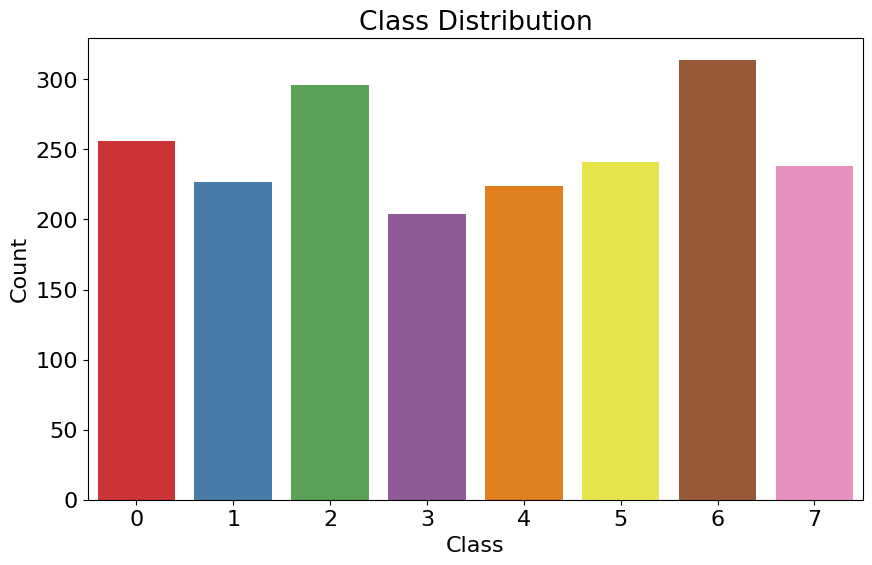

In [154]:
plt.figure(figsize=(10, 6))
sns.countplot(x='class', data=raw_df, palette='Set1')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.show()

Vemos como las 8 clases no estan balanceadas, sin embargo el desbalanceo no es tal para que deba preocuparnos, la clase mayoritaria es solamente 50% mayor que la clase minoritaria.

#### Relaciones entre variables

Empezaremos mostrando unos cuantos gráficos para ver como se relacionan las variables y si los comportamientos son coherentes con lo que esperaríamos

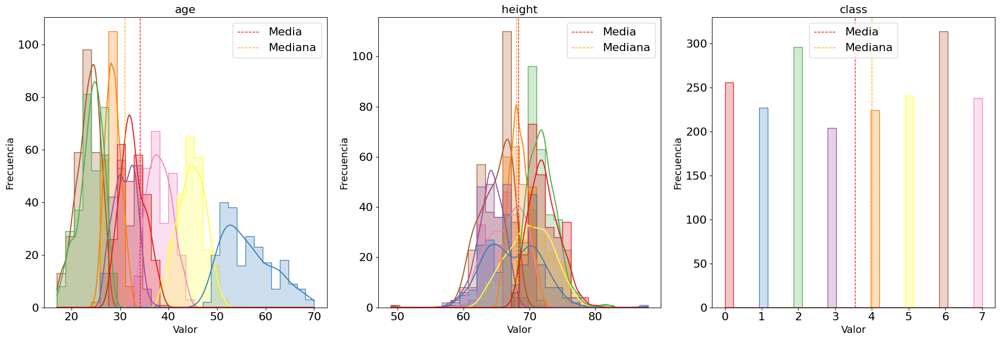

In [155]:
fig, axes = plt.subplots(1, 3, figsize=(20, 7))

numeric_columns = raw_df.select_dtypes(include=[np.number]).columns

for i, c in enumerate(numeric_columns):
    ax = axes.flatten()[i]
    sns.histplot(data=raw_df, x=c, hue='class', ax=ax, bins=30, kde=True, palette='Set1', element='step')
    ax.set_title(c, fontsize=16)
    ax.set_xlabel('Valor', fontsize=14)
    ax.set_ylabel('Frecuencia', fontsize=14)

    mean = raw_df[c].mean()
    median = raw_df[c].median()
    ax.axvline(mean, color='red', linestyle='dashed', linewidth=1, label='Media')
    ax.axvline(median, color='orange', linestyle='dashed', linewidth=1, label='Mediana')
    ax.legend()

plt.tight_layout()
plt.show()

En estos primeros histogramas vemos como se distribuyen las clases por edad y altura (las dos unicas variables numéricas).

Vemos como efectivamente las clases podrian representar a un grupo de personas de una franja de edad en concreto, especialmente en la clases 1 y 5, por otra parte por lo que hace la altura no vemos que una clase pueda representar un grupo de personas altas o bajas.

Procedemos ahora a mostrar la distribucion de la edad, la altura y las clases en funcion del sexo.

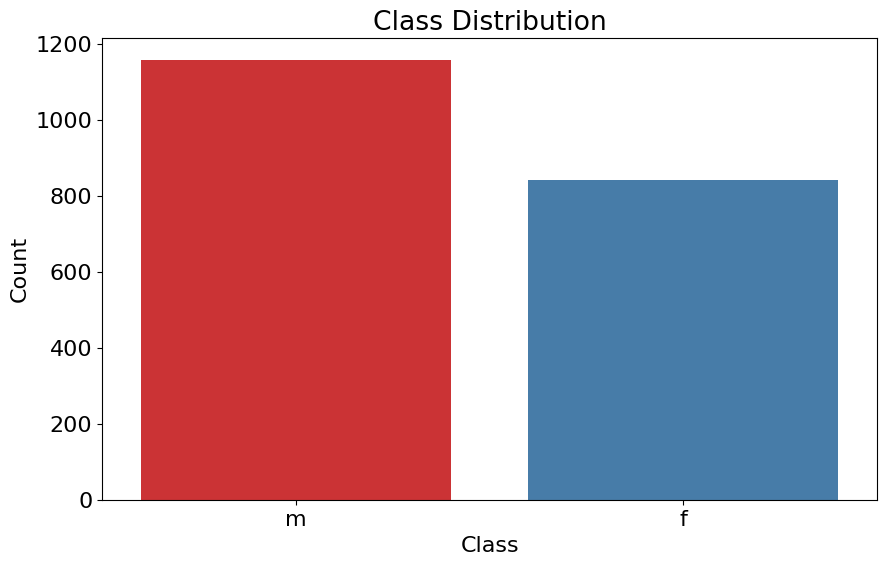

In [156]:
plt.figure(figsize=(10, 6))
sns.countplot(x='sex', data=raw_df, palette='Set1')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.show()

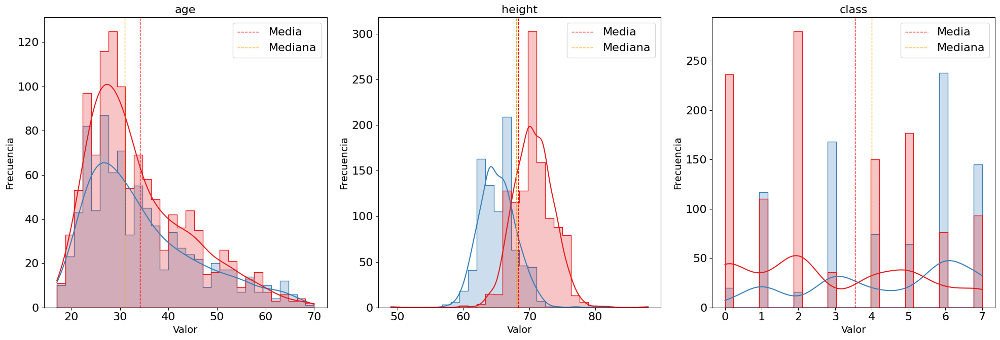

In [157]:
fig, axes = plt.subplots(1, 3, figsize=(20, 7))

numeric_columns = raw_df.select_dtypes(include=[np.number]).columns

for i, c in enumerate(numeric_columns):
    ax = axes.flatten()[i]
    sns.histplot(data=raw_df, x=c, hue='sex', ax=ax, bins=30, kde=True, palette='Set1', element='step')
    ax.set_title(c, fontsize=16)
    ax.set_xlabel('Valor', fontsize=14)
    ax.set_ylabel('Frecuencia', fontsize=14)

    mean = raw_df[c].mean()
    median = raw_df[c].median()
    ax.axvline(mean, color='red', linestyle='dashed', linewidth=1, label='Media')
    ax.axvline(median, color='orange', linestyle='dashed', linewidth=1, label='Mediana')
    ax.legend()

plt.tight_layout()
plt.show()

Vemos como en general hay mas hombres que mujeres en el estudio y que:
- la distribucion de la edad se comporta como esperariamos, ambos generos tienen la misma forma
- en la altura vemos como efectivamente los hombres son generalemente mas altos
- y en finalmente podemos ver como hay clases que si que podriamos considerar que discriminan bastante en funcion del genero, es decir, la 0 y la 2 son principalemente hombres y la 3 y la 6 son mayormente mujeres, las demas parecen estar equiparadas.

Procederemos ahora a analizar las variables categóricas

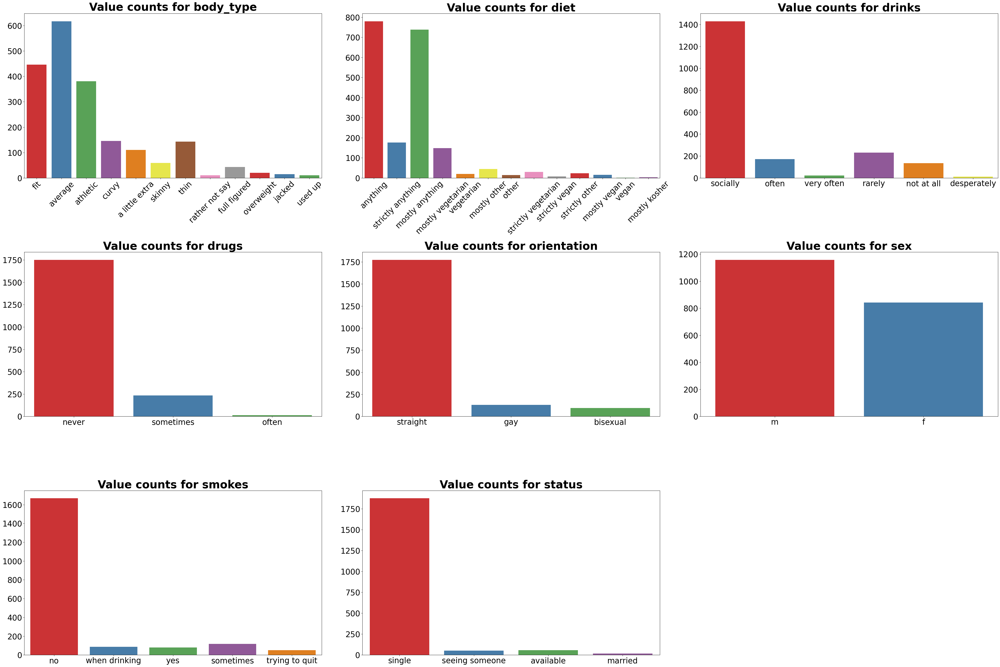

In [158]:
import math

non_numeric_columns = raw_df.select_dtypes(include=['object']).columns
filtered_columns = [col for col in non_numeric_columns if raw_df[col].nunique() <= 13]

# Calcular el numero de filas y columnas
num_plots = len(filtered_columns)
num_cols = math.ceil(math.sqrt(num_plots))
num_rows = math.ceil(num_plots / num_cols)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15 * num_cols, 10 * num_rows))

for i, column in enumerate(filtered_columns):
    row = i // num_cols
    col = i % num_cols
    sns.countplot(x=column, data=raw_df, ax=axes[row, col], palette='Set1')
    axes[row, col].set_title(f"Value counts for {column}", fontsize=35, fontweight='bold')
    axes[row, col].set_xlabel('')
    axes[row, col].set_ylabel('')
    if raw_df[column].nunique() > 7:
        axes[row, col].tick_params(axis='x', labelsize=25, rotation=45)
    else:
        axes[row, col].tick_params(axis='x', labelsize=25)
    axes[row, col].tick_params(axis='y', labelsize=25)
    

# Eliminar los ejes que no se usan
for j in range(i + 1, num_rows * num_cols):
    fig.delaxes(axes.flatten()[j])

plt.tight_layout()
plt.show()

In [159]:
print("Gente que no bebe: ", len(raw_df[raw_df['drinks'] == 'not at all'])/len(raw_df)*100)
print("Gente que no se droga: ", len(raw_df[raw_df['drugs'] == 'never'])/len(raw_df)*100)
print("Gente que se declara heterosexual: ", len(raw_df[raw_df['orientation'] == 'straight'])/len(raw_df)*100)
print("Gente que no fuma: ", len(raw_df[raw_df['smokes'] == 'no'])/len(raw_df)*100)
print("Gente que se declara casada: ", len(raw_df[raw_df['status'] == 'married'])/len(raw_df)*100)

Gente que no bebe:  6.75
Gente que no se droga:  87.55
Gente que se declara heterosexual:  88.7
Gente que no fuma:  83.35000000000001
Gente que se declara casada:  0.8500000000000001


Una vez mostrados los histogramas para las variables categóricas (con menos de 13 valores únicos), vemos como:
- la mayoría de la gente tiene un cuerpo atractivo por los canones actuales (fit, athletic, average, curvy, thin)
- por lo que hace la dieta, vemos como la mayoría de personas no hacen dieta, y que una minoria hace algun tipo de dieta vegana o vegetariana
- por otra parte si vemos la variable de bebidas alcholicas, vemos como sorprendentemente hay muchísima mas gente que bebe ya sea de fiesta o diariamente que gente que no bebe nunca, la gente que no bebe nunca representa tan solo 6.75% del total y que la mayoría de la gente que bebe lo suele hacer de fiesta o mientras socializa
- si hechamos un ojo a las drogas, vemos como hay mas gente de la que esperaba, un ~12.5% de gente declara consumir droga (con lo que probablemente sea mayor dado que podrían haber individuos que no lo declaren y lo hagan)
- por otra parte, vemos como la mayoría de las personas tienen una orientación heterosexual, tan solo hay un ~12% de gente que no lo es.
- si miramos la variable de fumar, vemos una grata sorpresa dado que tenia la hipótesis de que hay mas gente que fuma ya sea de forma esporádica o recurrente, vemos como la gente que no fuma representa un 83% de los individuos
- finalmente si vemos la variable de estado cívil, vemos como hay ~1% de la gente que esta casada, sorprendetemente, pero la mayoría de gente esta abierta al amor.

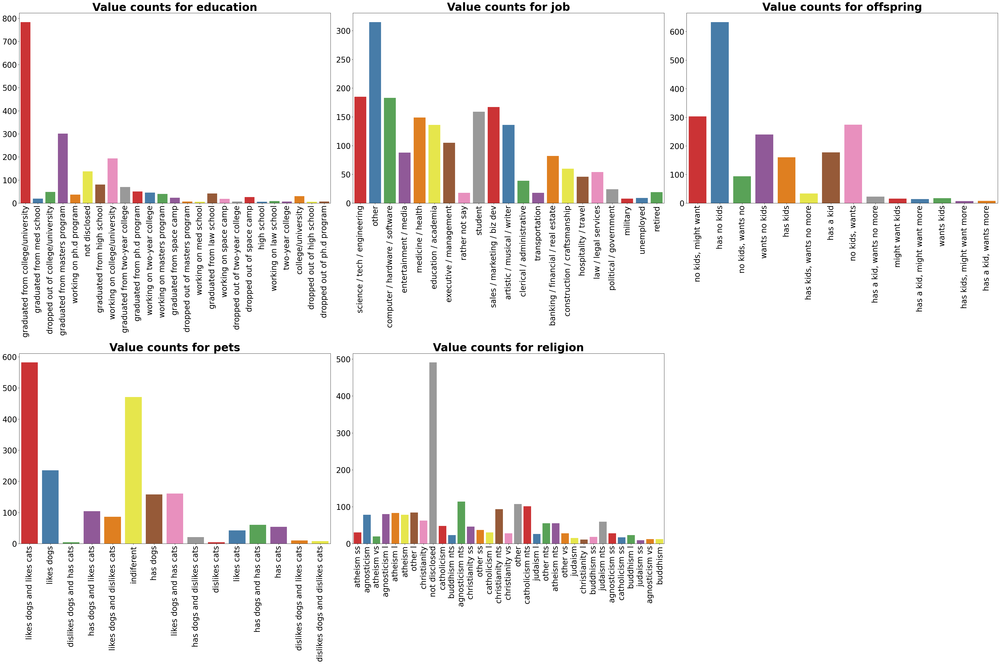

In [160]:
import math

non_numeric_columns = raw_df.select_dtypes(include=['object']).columns
filtered_columns = [col for col in non_numeric_columns if raw_df[col].nunique() > 13]

# Calcular el numero de filas y columnas
num_plots = len(filtered_columns)
num_cols = math.ceil(math.sqrt(num_plots))
num_rows = math.ceil(num_plots / num_cols)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15 * num_cols, 15 * num_rows))

for i, column in enumerate(filtered_columns):
    row = i // num_cols
    col = i % num_cols
    sns.countplot(x=column, data=raw_df, ax=axes[row, col], palette='Set1')
    axes[row, col].set_title(f"Value counts for {column}", fontsize=35, fontweight='bold')
    axes[row, col].set_xlabel('')
    axes[row, col].set_ylabel('')
    axes[row, col].tick_params(axis='x', labelsize=25, rotation=90)
    axes[row, col].tick_params(axis='y', labelsize=25)
    

# Eliminar los ejes que no se usan
for j in range(i + 1, num_rows * num_cols):
    fig.delaxes(axes.flatten()[j])

plt.tight_layout()
plt.show()

In [161]:
print("Gente que no tiene hijos: ", 
        (len(raw_df[raw_df['offspring'] == 'no kids, might want']) + 
         len(raw_df[raw_df['offspring'] == 'has no kids']) + 
         len(raw_df[raw_df['offspring'] == 'wants kids']) +
         len(raw_df[raw_df['offspring'] == 'no kids, wants no']) +
         len(raw_df[raw_df['offspring'] == 'no kids, wants'])) / len(raw_df)*100)

print("Gente que quiere tener hijos: ",
        (len(raw_df[raw_df['offspring'] == 'no kids, might want']) + 
         len(raw_df[raw_df['offspring'] == 'wants kids']) +
         len(raw_df[raw_df['offspring'] == 'no kids, wants']) +
         len(raw_df[raw_df['offspring'] == 'might want kids']) +
         len(raw_df[raw_df['offspring'] == 'has a kid, wants more']) +
         len(raw_df[raw_df['offspring'] == 'has kids, might want more']) +
         len(raw_df[raw_df['offspring'] == 'has a kid, might want more'])) / len(raw_df)*100)

print("Gente que no tiene hijos pero quiere tener: ",
        (len(raw_df[raw_df['offspring'] == 'no kids, might want']) + 
         len(raw_df[raw_df['offspring'] == 'wants kids']) +
         len(raw_df[raw_df['offspring'] == 'no kids, wants']) +
         len(raw_df[raw_df['offspring'] == 'might want kids'])) / len(raw_df)*100)

print("Gente que le dan igual las mascotas: ", len(raw_df[raw_df['pets'] == 'indiferent'])/len(raw_df)*100)

print("Religion not disclosed: ", len(raw_df[raw_df['religion'] == 'not disclosed'])/len(raw_df)*100)

Gente que no tiene hijos:  66.05
Gente que quiere tener hijos:  31.95
Gente que no tiene hijos pero quiere tener:  30.5
Gente que le dan igual las mascotas:  23.549999999999997
Religion not disclosed:  24.55


Si miramos las columnas con mas de 13 valores unicos, vemos que:
- generalmete los individuos de los datos o bien han terminado sus estudios universitarios y estan trabajando o bien estan estudiando un grado universtario
- respecto al trabajo, vemos como hay una distribucion de sectores bastante generalizada, tal vez podemos ver que en los trabajos STEM hay un porcentaje un poco mas elevado de individuos
- los individuos de nuestros datos generalmente no tienn hijos, 2/3 concretamente y por otra parte tan solo un 32% quiere tener hijos y del 32% un 95% no tiene hijos y un 5 si que los tiene.
- si miramos las mascotas, generalmente vemos como la gente suele tener y gustarles mas los perros que los gatos y luego hay un 24% de los individuos que les es indiferente las mascotas.
- la mayoría de los individuos no declaran ser de ninguna religion ~25% y la resta suelen ser agnosticos/ateos o cristianos/catolicos.

Procedemos ahora a ver si los distintos valores únicos de las variables estan sobrerepresentados en algun grupo

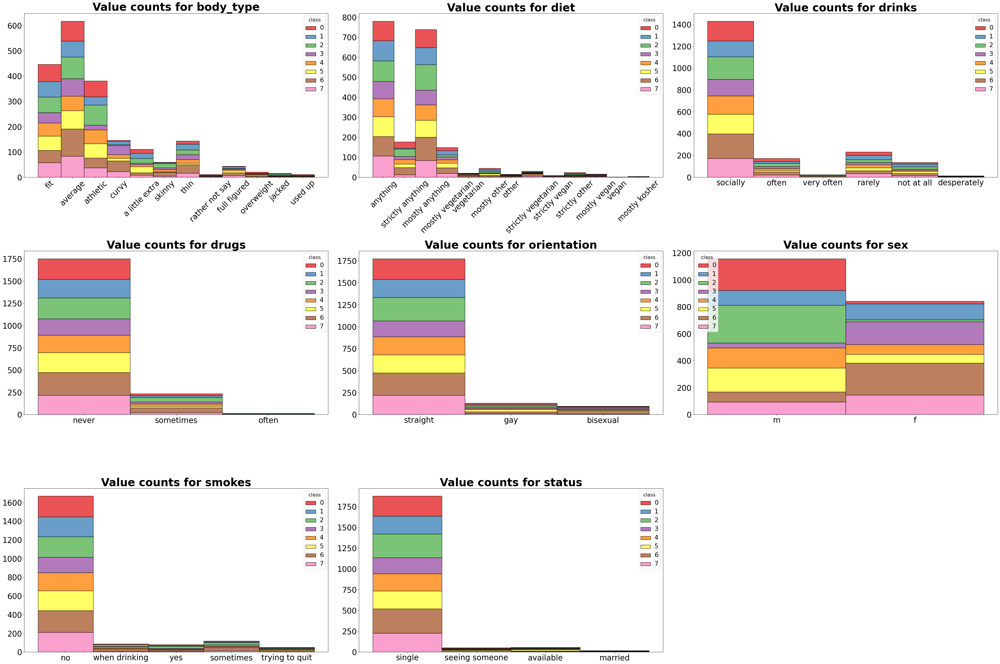

In [162]:
filtered_columns = [col for col in non_numeric_columns if raw_df[col].nunique() <= 13]
num_plots = len(filtered_columns)
num_cols = math.ceil(math.sqrt(num_plots))
num_rows = math.ceil(num_plots / num_cols)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15 * num_cols, 10 * num_rows))

for i, column in enumerate(filtered_columns):
    row = i // num_cols
    col = i % num_cols
    sns.histplot(data=raw_df, x=column, hue='class', multiple='stack', ax=axes[row, col], palette='Set1')
    axes[row, col].set_title(f"Value counts for {column}", fontsize=35, fontweight='bold')
    axes[row, col].set_xlabel('')
    axes[row, col].set_ylabel('')
    
    # Ajustar los ticks
    if raw_df[column].nunique() > 7:
        axes[row, col].tick_params(axis='x', labelsize=25, rotation=45)
    else:
        axes[row, col].tick_params(axis='x', labelsize=25)
    axes[row, col].tick_params(axis='y', labelsize=25)
    
    # Ajustar la leyenda
    legend = axes[row, col].legend_
    if legend is not None:
        for text in legend.get_texts():
            text.set_fontsize(20)  # Cambia el tamaño de la fuente de los textos

# Eliminar los ejes que no se usan
for j in range(i + 1, num_rows * num_cols):
    fig.delaxes(axes.flatten()[j])

plt.tight_layout()
plt.show()


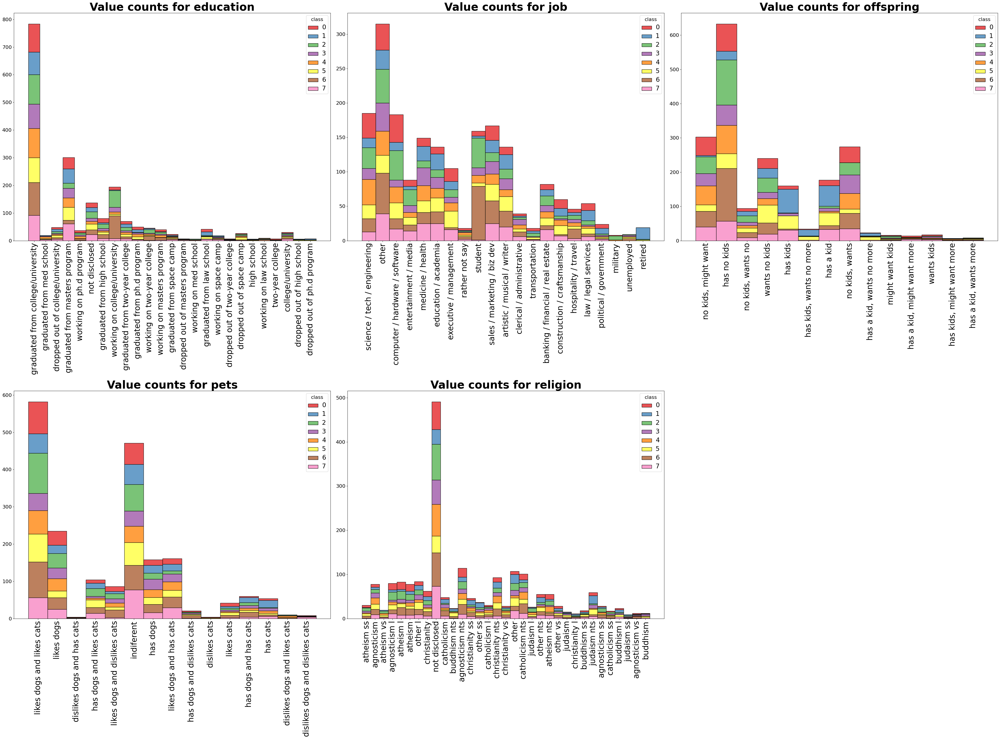

In [163]:
filtered_columns = [col for col in non_numeric_columns if raw_df[col].nunique() > 13]
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15 * num_cols, 15 * num_rows))

for i, column in enumerate(filtered_columns):
    row = i // num_cols
    col = i % num_cols
    sns.histplot(data=raw_df, x=column, hue='class', multiple='stack', ax=axes[row, col], palette='Set1')
    axes[row, col].set_title(f"Value counts for {column}", fontsize=35, fontweight='bold')
    axes[row, col].set_xlabel('')
    axes[row, col].set_ylabel('')
    
    axes[row, col].tick_params(axis='x', labelsize=25, rotation=90)
    
    # Ajustar la leyenda
    legend = axes[row, col].legend_
    if legend is not None:
        for text in legend.get_texts():
            text.set_fontsize(20)  # Cambia el tamaño de la fuente de los textos

# Eliminar los ejes que no se usan
for j in range(i + 1, num_rows * num_cols):
    fig.delaxes(axes.flatten()[j])

plt.tight_layout()
plt.show()


Vemos como en general no hay una clase que este representada por algun valor unico de alguna variable, vemos como en casi todas las variables, los grupos estan equiparados en representación en cada valor único de la variable.

Sin embargo en la variable del sexo, podemos ver como los grupos 0, 2 y 5 estan mas rrepresentados en la clase masculina y por otra parte, los grupos 3 y 6 estan mas representados en la clase femenina. Y tambien podemos observar unas ligeras descompensaciones en la clase de trabajo donde vemos que la clase 6 parece ser mayormente de estudiantes como tambien nos lo indica la variable de educación.

#### One-hot encoding
Ahora procederemos a realizar el one hot encoding para dividir los datos correctamente y hacer pca+tsne y mostrar la matriz de correlación

In [164]:
# One-hot encoding de las variables categóricas
categorical_columns = raw_df.select_dtypes(include=['object']).columns
df_encoded = pd.get_dummies(raw_df, columns=categorical_columns, drop_first=False)

print('Numero de columnas antes de la codificación:', raw_df.shape[1])
print('Numero de columnas después de la codificación:', df_encoded.shape[1])
print('Numero de filas:', df_encoded.shape[0])
df_encoded.head()

Numero de columnas antes de la codificación: 16
Numero de columnas después de la codificación: 159
Numero de filas: 2000


,age,height,class,body_type_a little extra,body_type_athletic,body_type_average,body_type_curvy,body_type_fit,body_type_full figured,body_type_jacked,...,sex_m,smokes_no,smokes_sometimes,smokes_trying to quit,smokes_when drinking,smokes_yes,status_available,status_married,status_seeing someone,status_single
0,27,72.0,2,False,False,False,False,True,False,False,...,True,True,False,False,False,False,False,False,False,True
1,25,68.0,4,False,False,True,False,False,False,False,...,True,True,False,False,False,False,False,False,False,True
2,56,67.0,1,False,False,True,False,False,False,False,...,False,True,False,False,False,False,False,False,False,True
3,42,67.0,5,False,False,True,False,False,False,False,...,True,True,False,False,False,False,False,False,False,True
4,29,73.0,0,False,False,False,False,True,False,False,...,True,True,False,False,False,False,False,False,False,True


#### Division en entrenamiento y test

Dividimos los datos en 70% conjunto de entrenamiento y 30% conjunto de test 

In [165]:
X = df_encoded.drop('class', axis=1)
y = df_encoded['class']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0, stratify=y)

#### Estandarizamos los datos para aplicar PCA

In [166]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print("Datos de entrenamiento normalizados:")
print(X_train_scaled[:1])
print("Datos de prueba normalizados:")
print(X_test_scaled[:1])

Datos de entrenamiento normalizados:
[[-1.11271399  0.42073583 -0.24943031  2.12922447 -0.6882472  -0.29056957
  -0.52444784 -0.13483997 -0.0758098  -0.10050378 -0.07088812 -0.18013433
  -0.27435163 -0.0758098  -0.80439967 -0.75815773 -0.02673567 -0.15048012
  -0.0758098   3.54855365 -0.08481889 -0.31311215 -0.11086983 -0.05352877
  -0.12635334 -0.02673567 -0.11086983 -0.08899082 -0.25898489 -0.29773641
  -0.36300195  0.62029635 -0.09681295  0.3889933  -0.08899082 -0.37549207
  -0.12038585 -0.16012815 -0.05986843 -0.07088812 -0.05352877 -0.11086983
  -0.05352877 -0.80681063 -0.20975466 -0.13206764 -0.41536648 -0.08481889
  -0.15294382 -0.10406885 -0.20412415 -0.05352877 -0.26980907 -0.07088812
  -0.33068147 -0.0656061  -0.14285714 -0.03782347  7.13104844 -0.09298136
  -0.16012815 -0.26674954 -0.19836002 -0.13483997 -0.31448545 -0.19044535
  -0.27284353 -0.22243035 -0.22768558 -0.15048012 -0.15776625 -0.27884067
  -0.07088812 -0.43875307 -0.11412538 -0.08899082 -0.10406885 -0.30478874
 

#### Aplicamos PCA

Procedemos a aplicar PCA, primero con 2 dimensiones

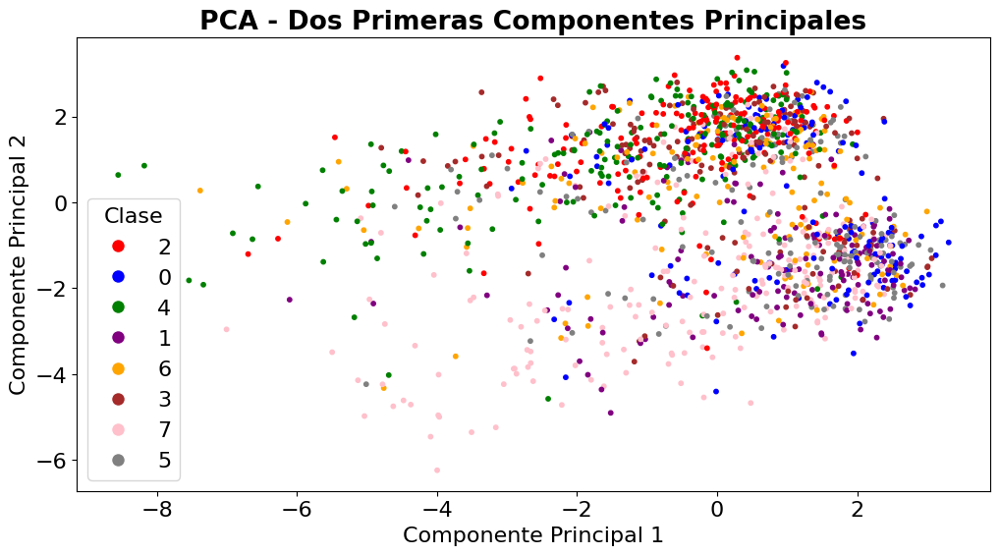

In [167]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

pca = PCA()
X_train_pca = pca.fit_transform(X_train_scaled)

# Asignar un color a cada clase
colors = ['red', 'blue', 'green', 'purple', 'orange', 'brown', 'pink', 'gray']
class_labels = y_train.unique()
class_colors = [colors[label] for label in y_train]

plt.figure(figsize=(12, 6))
scatter = plt.scatter(X_train_pca[:, 0], X_train_pca[:, 1], c=class_colors, s=10)

handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=colors[i], markersize=10) for i in range(len(class_labels))]
plt.legend(handles, class_labels, title="Clase")

plt.title('PCA - Dos Primeras Componentes Principales', fontweight='bold')
plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.show()

Vemos como se pueden observar dos ligeras aglomeraciones de datos, en general no siguen una nube muy gaussiana y no hay separabilidad entre clases

Probamos a continuación con 3 dimensiones a ver si mejora la cosa

In [168]:
import plotly.express as px
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)

# Seleccionar las tres primeras componentes del PCA
X_train_pca_3d = X_train_pca[:, :3]

fig = px.scatter_3d(x=X_train_pca_3d[:, 0], y=X_train_pca_3d[:, 1], z=X_train_pca_3d[:, 2], color=y_train_encoded, color_discrete_sequence=px.colors.qualitative.Set1)
fig.show()

En este caso observamos un poco mas de separabilidad y se ve una ligera aglomeracion de las clases 2 (purpura) y 6 (naranja), vemos como la nube de puntos es un poco mas gaussiana pero sin embargo no se alcanza a ver mucha separabilidad entre clases.

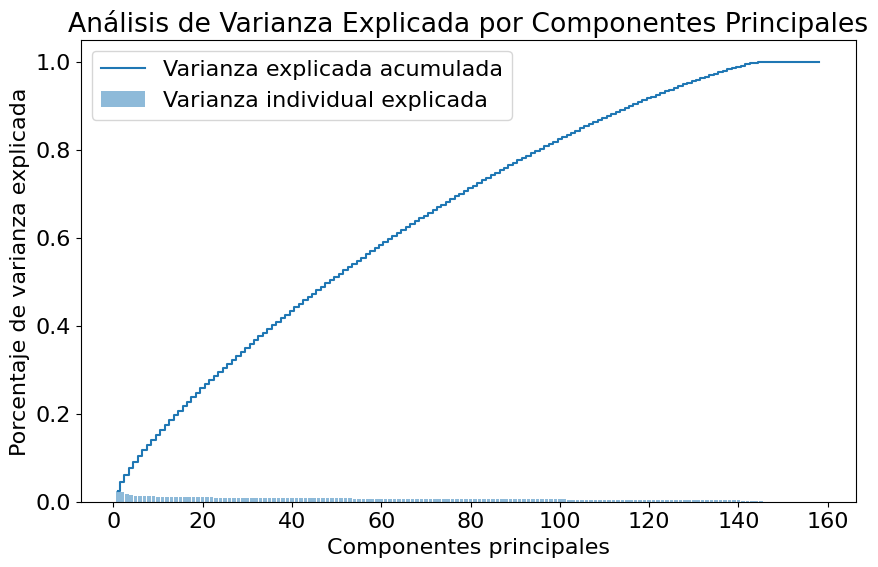

In [169]:
explained_variance = pca.explained_variance_ratio_  
plt.figure(figsize=(10, 6))
plt.bar(range(1, len(explained_variance) + 1), explained_variance, alpha=0.5, align='center', label='Varianza individual explicada')
plt.step(range(1, len(explained_variance) + 1), np.cumsum(explained_variance), where='mid', label='Varianza explicada acumulada')
plt.xlabel('Componentes principales')
plt.ylabel('Porcentaje de varianza explicada')
plt.legend(loc='best')
plt.title('Análisis de Varianza Explicada por Componentes Principales')
plt.show();

Vemos como nos hacia ver la visualizacion del PCA en 2 dimensiones, que las primeras componentes no nos explican un porcentaje de la varianza total muy alto, para cubrir un ~80% de la varianza necesitariamos unas 100 componentes.

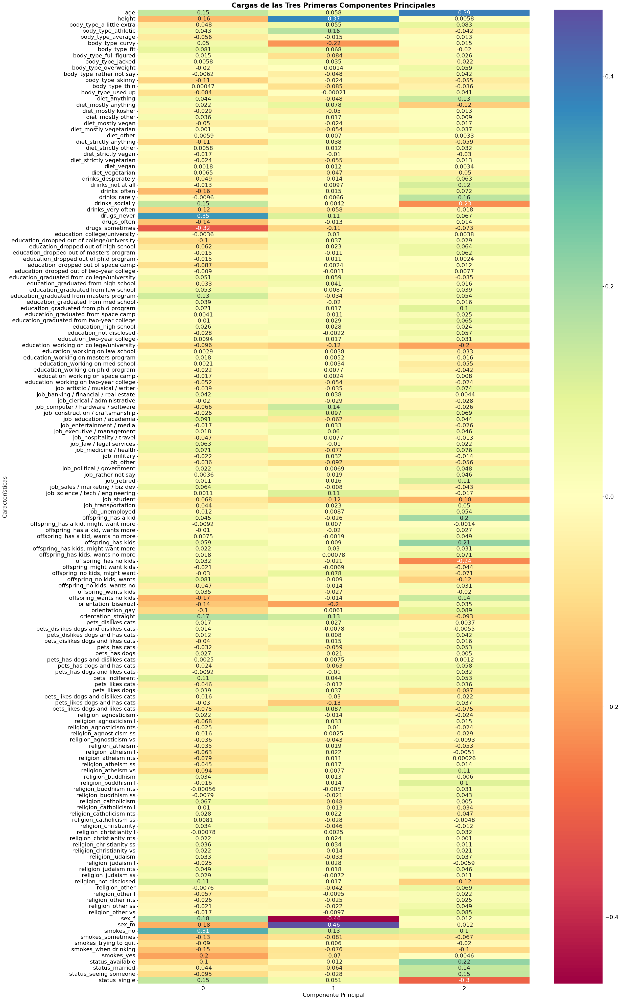

In [170]:
plt.figure(figsize=(25, 50))
components = pd.DataFrame(pca.components_[:3], columns=X.columns)
sns.heatmap(components.T, cmap='Spectral', annot=True)
plt.title('Cargas de las Tres Primeras Componentes Principales', fontweight='bold')
plt.xlabel('Componente Principal')
plt.ylabel('Características')
plt.show()

Vemos como:
- la primera componente se centra principalmente en el consumo de drigas, en el sexo, la edad y si la persona fuma.
- la segunda componente le da importancia al sexo y un poco a la altura y la orientacion sexual
- la tercera componente le da importancia a la edad, al estado civil, a si la persona tiene hijos o no y al consumo de alchol

#### Aplicamos TSNE

Procedemos a aplicar TSNE haciendo una mínima exploración de la perplejidad y las iteraciones

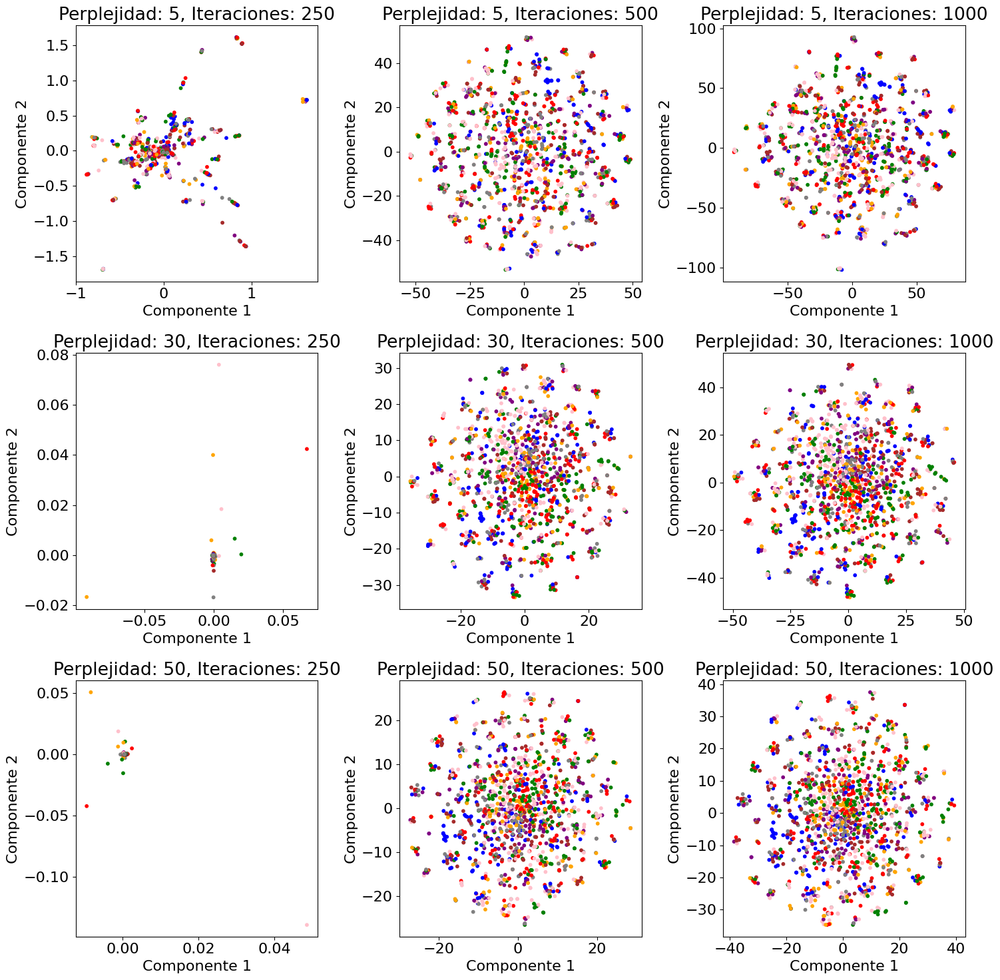

In [171]:
from sklearn.manifold import TSNE

# Definir los parámetros a explorar
perplexities = [5, 30, 50]
iterations = [250, 500, 1000]

fig, axes = plt.subplots(len(perplexities), len(iterations), figsize=(15, 15))

for i, perplexity in enumerate(perplexities):
    for j, n_iter in enumerate(iterations):
        tsne = TSNE(n_components=2, perplexity=perplexity, n_iter=n_iter, random_state=42)
        data_tsne = tsne.fit_transform(X_train_scaled)

        ax = axes[i, j]
        scatter = ax.scatter(data_tsne[:, 0], data_tsne[:, 1], c=class_colors, cmap='Spectral', s=10)
        ax.set_xlabel('Componente 1')
        ax.set_ylabel('Componente 2')
        ax.set_title(f'Perplejidad: {perplexity}, Iteraciones: {n_iter}')

plt.tight_layout()
plt.show()


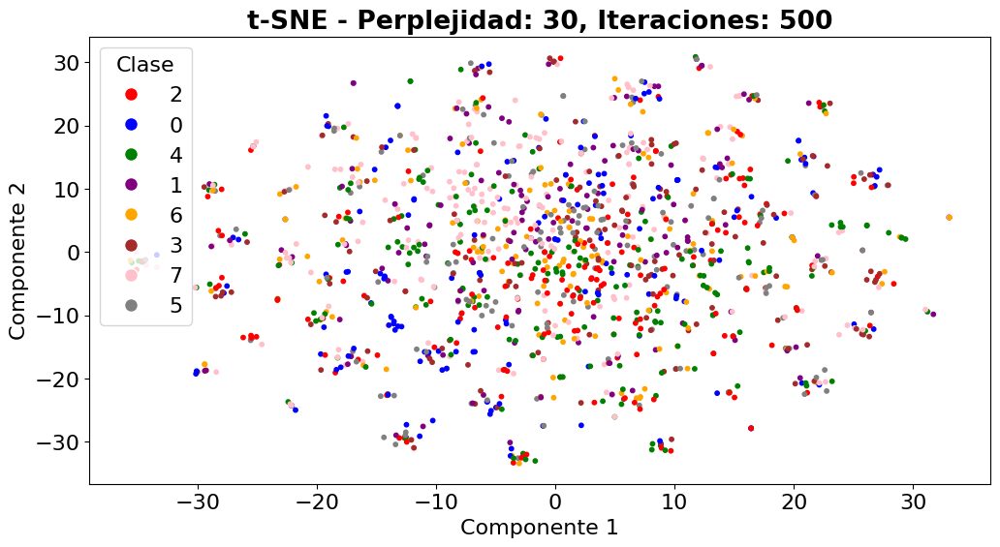

In [172]:
best_n_iter, best_perplexity = 500, 30

tsne = TSNE(n_components=2, perplexity=best_perplexity, n_iter=best_n_iter, random_state=42)
X_train_tsne = tsne.fit_transform(X_train_scaled)

plt.figure(figsize=(12, 6))
scatter = plt.scatter(X_train_tsne[:, 0], X_train_tsne[:, 1], c=class_colors, s=10, cmap='Spectral')

handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=colors[i], markersize=10) for i in range(len(class_labels))]
plt.legend(handles, class_labels, title="Clase")

plt.title('t-SNE - Perplejidad: 30, Iteraciones: 500', fontweight='bold')
plt.xlabel('Componente 1')
plt.ylabel('Componente 2')
plt.show()

Observamos, como con el PCA, que no hay una separabilidad de los datos con dos dimensiones

In [173]:
tsne = TSNE(n_components=3, perplexity=best_perplexity, n_iter=best_n_iter, random_state=42)

data_tsne = tsne.fit_transform(X_train_scaled)

fig = px.scatter_3d(x=data_tsne[:, 0], y=data_tsne[:, 1], z=data_tsne[:, 2], color=y_train_encoded, color_continuous_scale='Spectral')
fig.update_layout(scene=dict(xaxis_title='Componente 1', yaxis_title='Componente 2', zaxis_title='Componente 3'))
fig.show()

Y por otra parte vemos a su vez que tampoco hay una gran separabilidad con tres dimensiones

#### Correación

Procedemos a mostrar el grado de correlación que tienen todas las variables con la clase.

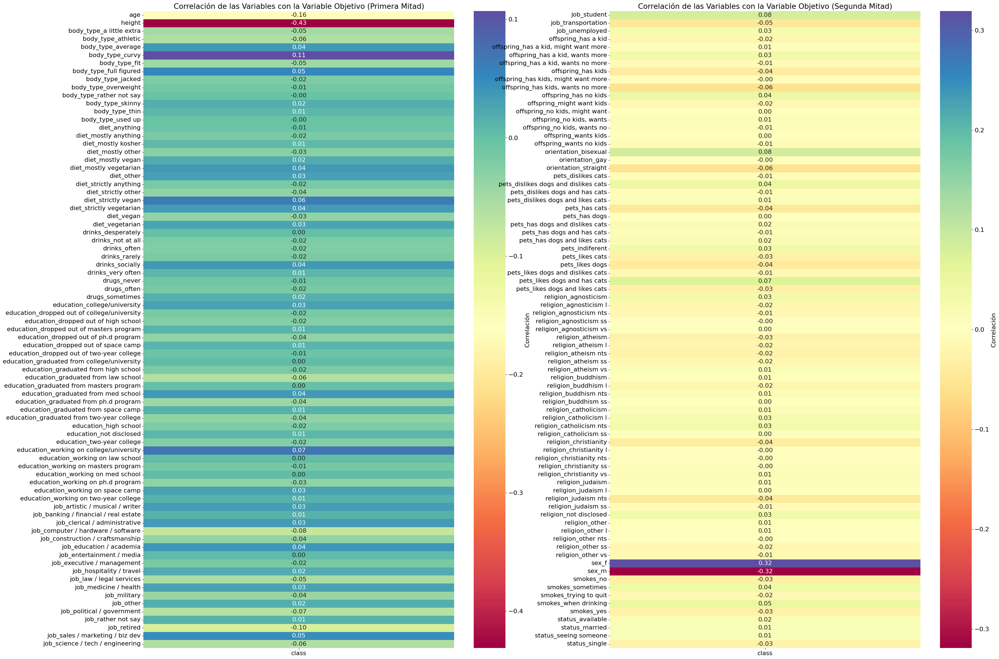

In [174]:
plt.figure(figsize=(40,30))
corr=df_encoded.corr()
corr_with_target = corr[['class']].drop('class')

mid_index = len(corr_with_target) // 2
first_half = corr_with_target.iloc[:mid_index]
second_half = corr_with_target.iloc[mid_index:]

# Primer gráfico
plt.subplot(1, 2, 1)
sns.heatmap(first_half, cmap='Spectral', annot=True, fmt=".2f", cbar_kws={'label': 'Correlación'})
plt.title('Correlación de las Variables con la Variable Objetivo (Primera Mitad)')

# Segundo gráfico
plt.subplot(1, 2, 2)
sns.heatmap(second_half, cmap='Spectral', annot=True, fmt=".2f", cbar_kws={'label': 'Correlación'})
plt.title('Correlación de las Variables con la Variable Objetivo (Segunda Mitad)')

plt.show()

Observamos como en general no hay mucha correlación entre las variables y la variable objetivo, sin embargo, vemos como la altura y el género si que tienen una correlación un poco mas significativa

## Apartado B
Partiremos de un resultado base con el que comparar. Ajusta una regresión logística a los datos explorando adecuadamente sus hiperparámetros. Evalúa adecuadamente el resultado del modelo.

Probaremos con los datos normalizados entre 0 y 1 dado que el hecho de tener valores negativos en la altura y la edad, no es nada representativo.

In [175]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

Convertimos a dataframe los datos escalados

In [176]:
print(type(X_train_scaled), X_train_scaled.shape)
print(type(X_train), X_train.shape)

X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

print(type(X_train_scaled), X_train_scaled.shape)
print(type(X_train), X_train.shape)

<class 'numpy.ndarray'> (1400, 158)
<class 'pandas.core.frame.DataFrame'> (1400, 158)
<class 'pandas.core.frame.DataFrame'> (1400, 158)
<class 'pandas.core.frame.DataFrame'> (1400, 158)


Aplicamos primero el modelo a los datos escalados

In [177]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

lr = LogisticRegression(max_iter=10000)
param_grid = {
    'penalty': ['l1', 'l2'],
    'C': [0.01, 0.1, 1, 10, 100],
    'solver': ['lbfgs', 'liblinear', 'saga', 'newton-cg']
}

lr_gs = GridSearchCV(estimator=lr, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)
lr_gs.fit(X_train_scaled, y_train)
y_pred = lr_gs.predict(X_test_scaled)

print("Classification Report:")
print(classification_report(y_test, y_pred))

Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.88      0.89        77
           1       1.00      0.99      0.99        68
           2       0.94      0.96      0.95        89
           3       0.90      0.75      0.82        61
           4       0.74      0.84      0.78        67
           5       0.86      0.88      0.87        72
           6       0.90      0.96      0.93        94
           7       0.85      0.81      0.83        72

    accuracy                           0.89       600
   macro avg       0.89      0.88      0.88       600
weighted avg       0.89      0.89      0.89       600



Probamos ahora con los datos sin escalar, dado que la regresión logísitca puede ser ligeramente sensible al escalado

In [178]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

lr = LogisticRegression(max_iter=10000)

param_grid = {
    'penalty': ['l2'],
    'C': [0.01, 0.1, 1, 10, 100],
    'solver': ['lbfgs', 'liblinear', 'saga', 'newton-cg']
}

lr_gs = GridSearchCV(estimator=lr, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)
lr_gs.fit(X_train, y_train)
y_pred = lr_gs.predict(X_test)

print("Classification Report:")
print(classification_report(y_test, y_pred))

/home/jordimunoz/jordi/q7/apa/apa_env/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jordimunoz/jordi/q7/apa/apa_env/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.94      0.93        77
           1       1.00      0.99      0.99        68
           2       0.98      0.96      0.97        89
           3       0.98      0.87      0.92        61
           4       0.87      0.93      0.90        67
           5       0.93      0.92      0.92        72
           6       0.91      0.96      0.93        94
           7       0.90      0.92      0.91        72

    accuracy                           0.94       600
   macro avg       0.94      0.93      0.93       600
weighted avg       0.94      0.94      0.94       600



Observamos como obtenemos mejores resultados con los datos no escalados, vemos como en general todas las clases obtienen una precision y un recall mas alto en los datos sin escalar, vemos como la f1 score es 4 puntos mas alta, así que nos quedamos como mejor modelo de la regresion logistica el obtenido en la exploración de hiperparametros con los datos no escalados.

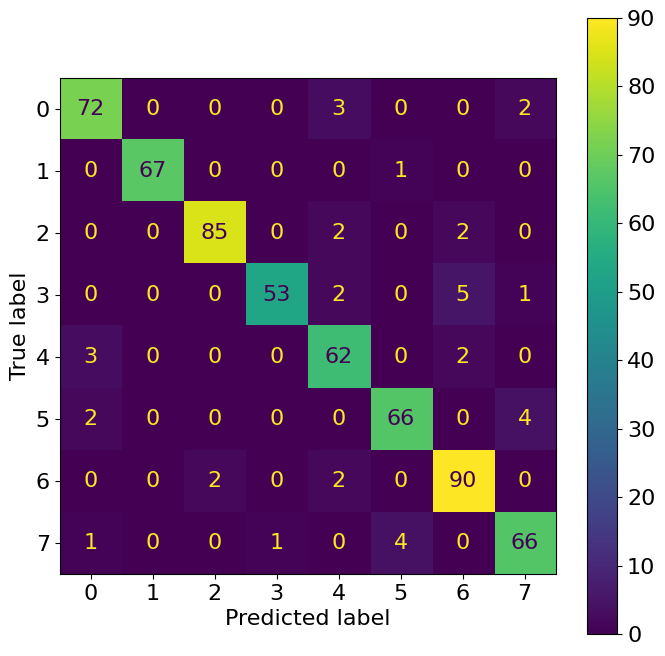

In [179]:
plt.figure(figsize=(8,8));
ConfusionMatrixDisplay.from_estimator(lr_gs, X_test,y_test, ax=plt.subplot());

Vemos como los resultados son sorprendentemente buenos, en todas las clases tenemos una f1 score de un 90% o mas, en la clase 1 solo fallamos en un individuo.

Y como media tenemos un 93% de la metrica f1.

In [180]:
show_html(pd.DataFrame(lr_gs.cv_results_).loc[:, ['params', 'mean_test_score', 'rank_test_score']].sort_values(by='rank_test_score').head().to_html())

results_df = save_results(lr_gs, X_test, y_test, 'Logistic', results_df)

,params,mean_test_score,rank_test_score
4,"{'C': 0.1, 'penalty': 'l2', 'solver': 'lbfgs'}",0.930,1
7,"{'C': 0.1, 'penalty': 'l2', 'solver': 'newton-cg'}",0.929,2
11,"{'C': 1, 'penalty': 'l2', 'solver': 'newton-cg'}",0.924,3
8,"{'C': 1, 'penalty': 'l2', 'solver': 'lbfgs'}",0.924,3
15,"{'C': 10, 'penalty': 'l2', 'solver': 'newton-cg'}",0.916,5


In [181]:
show_html(results_df.to_html())

,train XV acc,test acc,precision score (M),recall score (M),f1 score (M)
Logistic,0.93,0.935,0.937,0.933,0.934


In [182]:
r2_train = lr_gs.score(X_train, y_train)
r2_test = lr_gs.score(X_test, y_test)

print(f"R² del conjunto de entrenamiento: {r2_train:.4f}")
print(f"R² del conjunto de test: {r2_test:.4f}")

R² del conjunto de entrenamiento: 0.9736
R² del conjunto de test: 0.9350


Observamos como no hay casi sobreespecializacion dado que tenemos menos de un 4% de diferencia entre la R² del conjunto de train y del de test

## Apartado C
Los perfiles probablemente correspondan a particiones no lineales de los datos. Ajusta una SVM con kernel cuadrático y con kernel RBF. Configúralos para que predigan la probabilidad de las clases. Explorando adecuadamente sus hiperparámetros. Evalúa el resultado de los modelos.

Sabemos que los SVM son muy sensibles al escaldo de datos así que probaremos con los datos escalados para ver como de sensibles son y sino nos quedaremos con el modelo entrenado con los datos no escalados.

In [183]:
from sklearn.svm import SVC

param_grid_poly = {
    'C': [0.1, 1, 10, 100],
    'degree': [2],
    'gamma': ['scale', 'auto'],
    'coef0': [0, 1, 10]
}

param_grid_rbf = {
    'C': [0.1, 1, 10, 100],
    'gamma': ['scale', 'auto']
}

svm_poly = SVC(kernel='poly', probability=True)
svm_poly_gs = GridSearchCV(estimator=svm_poly, param_grid=param_grid_poly, cv=5, scoring='accuracy', n_jobs=-1)

svm_rbf = SVC(kernel='rbf', probability=True)
svm_rbf_gs = GridSearchCV(estimator=svm_rbf, param_grid=param_grid_rbf, cv=5, scoring='accuracy', n_jobs=-1)

svm_poly_gs.fit(X_train_scaled, y_train)

svm_rbf_gs.fit(X_train_scaled, y_train)

y_pred_poly = svm_poly_gs.predict(X_test_scaled)
print("Classification Report for SVM with Polynomial Kernel:")
print(classification_report(y_test, y_pred_poly))

y_pred_rbf = svm_rbf_gs.predict(X_test_scaled)
print("Classification Report for SVM with RBF Kernel:")
print(classification_report(y_test, y_pred_rbf))

Classification Report for SVM with Polynomial Kernel:
              precision    recall  f1-score   support

           0       0.61      0.77      0.68        77
           1       0.87      0.76      0.81        68
           2       0.77      0.78      0.77        89
           3       0.61      0.64      0.62        61
           4       0.49      0.49      0.49        67
           5       0.63      0.69      0.66        72
           6       0.84      0.70      0.76        94
           7       0.75      0.68      0.72        72

    accuracy                           0.69       600
   macro avg       0.70      0.69      0.69       600
weighted avg       0.71      0.69      0.70       600

Classification Report for SVM with RBF Kernel:
              precision    recall  f1-score   support

           0       0.60      0.75      0.67        77
           1       0.82      0.75      0.78        68
           2       0.71      0.76      0.74        89
           3       0.61      0.

Vemos que tanto en el SVM con kernel cuadrático como con el RBF, tenemos unos resultados un 20-25% peores (teniendo en cuenta la macro de la métrica f1) que la regresión logística, esto nos da algun indicio de que los datos no escalados probablemente obtendran unos resultados mucho mejores

In [184]:
from sklearn.svm import SVC

param_grid_poly = {
    'C': [0.1, 1, 10, 100],
    'degree': [2],
    'gamma': ['scale', 'auto'],
    'coef0': [0, 1, 10]
}

param_grid_rbf = {
    'C': [0.1, 1, 10, 100],
    'gamma': ['scale', 'auto']
}

svm_poly = SVC(kernel='poly', probability=True)
svm_poly_gs = GridSearchCV(estimator=svm_poly, param_grid=param_grid_poly, cv=5, scoring='accuracy', n_jobs=-1)

svm_rbf = SVC(kernel='rbf', probability=True)
svm_rbf_gs = GridSearchCV(estimator=svm_rbf, param_grid=param_grid_rbf, cv=5, scoring='accuracy', n_jobs=-1)

svm_poly_gs.fit(X_train, y_train)

svm_rbf_gs.fit(X_train, y_train)

y_pred_poly = svm_poly_gs.predict(X_test)
print("Classification Report for SVM with Polynomial Kernel:")
print(classification_report(y_test, y_pred_poly))

y_pred_rbf = svm_rbf_gs.predict(X_test)
print("Classification Report for SVM with RBF Kernel:")
print(classification_report(y_test, y_pred_rbf))

Classification Report for SVM with Polynomial Kernel:
              precision    recall  f1-score   support

           0       0.92      0.95      0.94        77
           1       0.99      1.00      0.99        68
           2       0.99      0.92      0.95        89
           3       0.90      0.85      0.87        61
           4       0.86      0.88      0.87        67
           5       0.96      0.92      0.94        72
           6       0.90      0.96      0.93        94
           7       0.92      0.93      0.92        72

    accuracy                           0.93       600
   macro avg       0.93      0.93      0.93       600
weighted avg       0.93      0.93      0.93       600

Classification Report for SVM with RBF Kernel:
              precision    recall  f1-score   support

           0       0.92      0.94      0.93        77
           1       1.00      1.00      1.00        68
           2       0.96      0.96      0.96        89
           3       0.91      0.

Vemos como efecitvamente, usando los datos no escalados, tenemos unos resultados muy parecidos a los obtenidos con la regresión loǵistica, así que nos quedaremos con los resultados con los datos no escalados también.

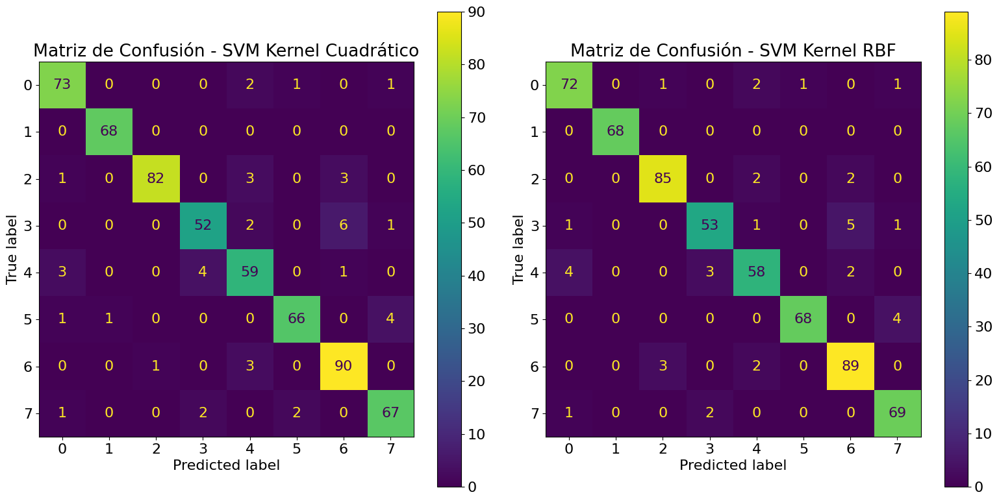

In [185]:
plt.figure(figsize=(16, 8))
ConfusionMatrixDisplay.from_estimator(svm_poly_gs, X_test, y_test, ax=plt.subplot(1, 2, 1))
plt.title('Matriz de Confusión - SVM Kernel Cuadrático')

ConfusionMatrixDisplay.from_estimator(svm_rbf_gs, X_test, y_test, ax=plt.subplot(1, 2, 2))
plt.title('Matriz de Confusión - SVM Kernel RBF')

plt.tight_layout()
plt.show()

Vemos como en general el modelo se especializa mas en algunas clases y pierde un poco de precision y recall en otras, vemos que pese a que son muy parecidos, claramente de los dos modelos, el que usa un kernel RBF dado que tiene mejores resultados en todas las clases excepto en la 0 y vemos como recuperamos el individuo que perdiamos con la regresión logística en la clase 1.

In [186]:
show_html(pd.DataFrame(svm_poly_gs.cv_results_).loc[:, ['params', 'mean_test_score', 'rank_test_score']].sort_values(by='rank_test_score').head().to_html())
results_df = save_results(svm_poly_gs, X_test, y_test, 'SVM Poly', results_df)

show_html(pd.DataFrame(svm_rbf_gs.cv_results_).loc[:, ['params', 'mean_test_score', 'rank_test_score']].sort_values(by='rank_test_score').head().to_html())
results_df = save_results(svm_rbf_gs, X_test, y_test, 'SVM RBF', results_df)

,params,mean_test_score,rank_test_score
5,"{'C': 0.1, 'coef0': 10, 'degree': 2, 'gamma': 'auto'}",0.942,1
20,"{'C': 100, 'coef0': 1, 'degree': 2, 'gamma': 'scale'}",0.942,2
14,"{'C': 10, 'coef0': 1, 'degree': 2, 'gamma': 'scale'}",0.941,3
16,"{'C': 10, 'coef0': 10, 'degree': 2, 'gamma': 'scale'}",0.941,4
1,"{'C': 0.1, 'coef0': 0, 'degree': 2, 'gamma': 'auto'}",0.939,5


,params,mean_test_score,rank_test_score
3,"{'C': 1, 'gamma': 'auto'}",0.946,1
6,"{'C': 100, 'gamma': 'scale'}",0.942,2
5,"{'C': 10, 'gamma': 'auto'}",0.938,3
4,"{'C': 10, 'gamma': 'scale'}",0.937,4
7,"{'C': 100, 'gamma': 'auto'}",0.935,5


In [187]:
show_html(results_df.sort_values(by='test acc', ascending=False).to_html())

,train XV acc,test acc,precision score (M),recall score (M),f1 score (M)
SVM RBF,0.946,0.937,0.937,0.934,0.936
Logistic,0.930,0.935,0.937,0.933,0.934
SVM Poly,0.942,0.928,0.928,0.926,0.926


Vemos como los resultados de los dos SVM dejan entre medias a la regresión logística, pero los tres obtienen resultados muy parecidos, se encuentran los tres entre un +/-1% en la precision de test

In [188]:
r2_train_svm_rbf = svm_rbf_gs.score(X_train, y_train)
r2_test_svm_rbf = svm_rbf_gs.score(X_test, y_test)

print(f"R² del conjunto de entrenamiento (SVM RBF): {r2_train_svm_rbf:.4f}")
print(f"R² del conjunto de test (SVM RBF): {r2_test_svm_rbf:.4f}")

R² del conjunto de entrenamiento (SVM RBF): 0.9650
R² del conjunto de test (SVM RBF): 0.9367


Como vemos tmapoco se observa sobreespecialización en este modelo, incluso hay menos sobreespecialización que en la regresión logística

## Apartado D 
El espacio que tenemos para los datos es mayoritariamente discreto, y probablemente sea sencillo hacer particiones que permitan separar los perfiles. Ajusta un modelo Random
Forest y un modelo Extreme Randomized Trees a los datos explorando adecuadamente sus hiperparámetros. Evalúa el resultado de los modelos y compáralos con los modelos anteriores.

Dado que los dos anteriores modelos tenian un rendimiento mejor con los datos no escalados y los modelos de árboles se comportan de igual forma esten o no los datos escalados, seguiremos usando los datos no escalados

In [189]:
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier

param_grid_rf = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

param_grid_et = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

rf = RandomForestClassifier(random_state=42)
rf_gs = GridSearchCV(estimator=rf, param_grid=param_grid_rf, cv=5, scoring='accuracy', n_jobs=-1)
et = ExtraTreesClassifier(random_state=42)
et_gs = GridSearchCV(estimator=et, param_grid=param_grid_et, cv=5, scoring='accuracy', n_jobs=-1)

rf_gs.fit(X_train, y_train)
et_gs.fit(X_train, y_train)

y_pred_rf = rf_gs.predict(X_test)
print("Classification Report for Random Forest:")
print(classification_report(y_test, y_pred_rf))

y_pred_et = et_gs.predict(X_test)
print("Classification Report for Extra Trees:")
print(classification_report(y_test, y_pred_et))

Classification Report for Random Forest:
              precision    recall  f1-score   support

           0       0.80      0.90      0.85        77
           1       0.91      0.91      0.91        68
           2       0.90      0.91      0.91        89
           3       0.93      0.82      0.87        61
           4       0.79      0.69      0.74        67
           5       0.80      0.74      0.77        72
           6       0.86      0.97      0.91        94
           7       0.78      0.78      0.78        72

    accuracy                           0.85       600
   macro avg       0.85      0.84      0.84       600
weighted avg       0.85      0.85      0.84       600

Classification Report for Extra Trees:
              precision    recall  f1-score   support

           0       0.69      0.74      0.71        77
           1       0.79      0.87      0.83        68
           2       0.71      0.90      0.80        89
           3       0.59      0.48      0.53        6

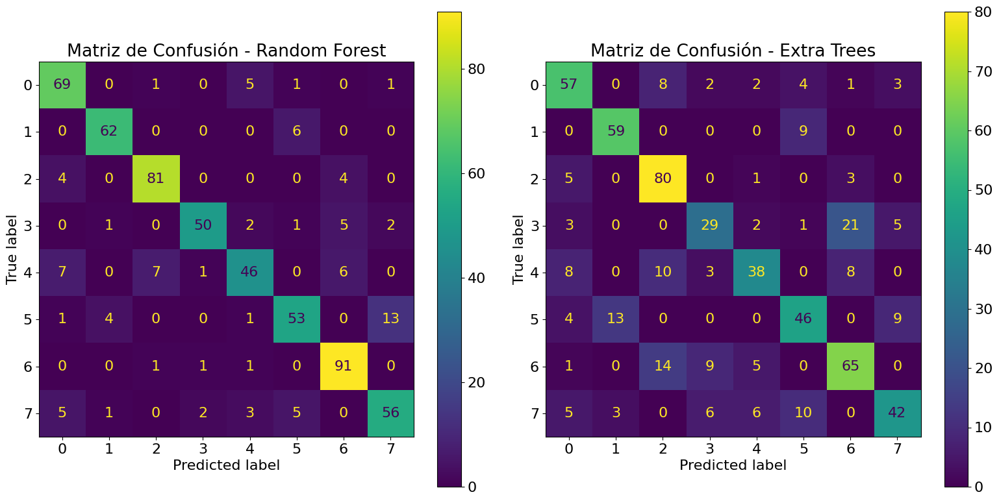

In [190]:
plt.figure(figsize=(16, 8))
ConfusionMatrixDisplay.from_estimator(rf_gs, X_test, y_test, ax=plt.subplot(1, 2, 1))
plt.title('Matriz de Confusión - Random Forest')

ConfusionMatrixDisplay.from_estimator(et_gs, X_test, y_test, ax=plt.subplot(1, 2, 2))
plt.title('Matriz de Confusión - Extra Trees')

plt.tight_layout()
plt.show()

Observamos como no obtenemos mejores resultados que ninguno de los tres modelos previos, de hecho el modelo que usa un randomizado extremo es bastante peor, empeora mas de un 25% respecto todos los demas modelos.

Por otra parte el modelo de Random Forest pierde un 10% de media en todas las clases, obteniendo un 85% en la métrica f1, así que tal vez nos es de buena ayuda al combinarlo posteriormente con el mejor modelo de SVM y la regresión logística.

In [191]:
show_html(pd.DataFrame(rf_gs.cv_results_).loc[:, ['params', 'mean_test_score', 'rank_test_score']].sort_values(by='rank_test_score').head().to_html())
results_df = save_results(rf_gs, X_test, y_test, 'Random Forest', results_df)

show_html(pd.DataFrame(et_gs.cv_results_).loc[:, ['params', 'mean_test_score', 'rank_test_score']].sort_values(by='rank_test_score').head().to_html())
results_df = save_results(et_gs, X_test, y_test, 'Extra Trees', results_df)

,params,mean_test_score,rank_test_score
1,"{'bootstrap': True, 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}",0.812,1
89,"{'bootstrap': True, 'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 300}",0.811,2
58,"{'bootstrap': True, 'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 200}",0.811,3
7,"{'bootstrap': True, 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 200}",0.811,4
88,"{'bootstrap': True, 'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 200}",0.810,5


,params,mean_test_score,rank_test_score
190,"{'bootstrap': False, 'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}",0.644,1
1,"{'bootstrap': True, 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}",0.641,2
85,"{'bootstrap': True, 'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 200}",0.641,2
189,"{'bootstrap': False, 'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}",0.639,4
3,"{'bootstrap': True, 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 100}",0.638,5


Vemos como el mejor modelo lo obtenemos dejando que haya un solo ejemplo en las hojas y que la division se haga minimo con 2 instancias (es decir el minimo posible). Vemos como el número de árboles es ni mas ni menos que 200.

In [192]:
show_html(results_df.sort_values(by='test acc', ascending=False).to_html())

,train XV acc,test acc,precision score (M),recall score (M),f1 score (M)
SVM RBF,0.946,0.937,0.937,0.934,0.936
Logistic,0.930,0.935,0.937,0.933,0.934
SVM Poly,0.942,0.928,0.928,0.926,0.926
Random Forest,0.812,0.847,0.847,0.838,0.841
Extra Trees,0.644,0.693,0.689,0.683,0.682


Vemos como efectivamente el modelo de extreme randomized trees es realmente malo y como el random forest deja bastante que desear teniendo en cuenta la cantidad de árboles que se necesitan para los dos mejores modelos obtenidos

In [193]:
# Random Forest
r2_train_rf = rf_gs.score(X_train, y_train)
r2_test_rf = rf_gs.score(X_test, y_test)

print(f"R² del conjunto de entrenamiento (Random Forest): {r2_train_rf:.4f}")
print(f"R² del conjunto de test (Random Forest): {r2_test_rf:.4f}")

# Extra Trees
r2_train_et = et_gs.score(X_train, y_train)
r2_test_et = et_gs.score(X_test, y_test)

print(f"R² del conjunto de entrenamiento (Extra Trees): {r2_train_et:.4f}")
print(f"R² del conjunto de test (Extra Trees): {r2_test_et:.4f}")

R² del conjunto de entrenamiento (Random Forest): 1.0000
R² del conjunto de test (Random Forest): 0.8467
R² del conjunto de entrenamiento (Extra Trees): 1.0000
R² del conjunto de test (Extra Trees): 0.6933


Como vemos hay muchisimo sobreajuste en los datos, los modelos memorizan completamente los datos y eso conlleva a predecir resultados no conocidos muy malamente.

### XGBoost y CatBoost
Procederemos ahora probando otros dos tipos de modelos de árboles, emepezando con los XGBoost que son un modelo muy utilizado en muchas competiciones de Kaggle y luego usaremos CatBoost dado que tenemos bastantes varibales categóricas
- XGBoost mejora el rendimiento de los árboles de decisión tradicionales mediante la técnica de gradient boosting, donde cada nuevo árbol corrige los errores del árbol anterior
- CatBoost al igual que XGBoost, es un algoritmo de boosting basado en árboles de decisión. Sin embargo, está especialmente optimizado para trabajar con características categóricas

/home/jordimunoz/jordi/q7/apa/apa_env/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [17:19:57] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/home/jordimunoz/jordi/q7/apa/apa_env/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [17:19:57] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/home/jordimunoz/jordi/q7/apa/apa_env/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [17:19:57] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/home/jordimunoz/jordi/q7/apa/apa_env/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [17:19:57] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/home/jordimunoz/jordi/q7/apa/apa_env/lib/py

Classification Report for XGBoost:
              precision    recall  f1-score   support

           0       0.90      0.94      0.92        77
           1       0.99      1.00      0.99        68
           2       0.96      0.92      0.94        89
           3       0.93      0.89      0.91        61
           4       0.85      0.93      0.89        67
           5       0.95      0.97      0.96        72
           6       0.93      0.91      0.92        94
           7       0.96      0.92      0.94        72

    accuracy                           0.93       600
   macro avg       0.93      0.93      0.93       600
weighted avg       0.93      0.93      0.93       600



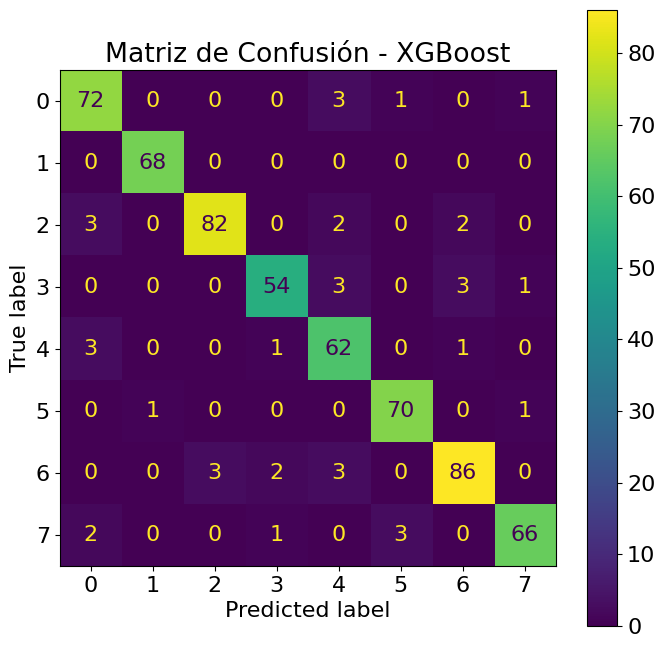

,train XV acc,test acc,precision score (M),recall score (M),f1 score (M)
SVM RBF,0.946,0.937,0.937,0.934,0.936
Logistic,0.930,0.935,0.937,0.933,0.934
XGBoost,0.943,0.933,0.933,0.934,0.933
SVM Poly,0.942,0.928,0.928,0.926,0.926
Random Forest,0.812,0.847,0.847,0.838,0.841
Extra Trees,0.644,0.693,0.689,0.683,0.682


In [194]:
import xgboost as xgb

xgb_model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')

param_grid_xgb = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 6, 9],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

xgb_gs = GridSearchCV(estimator=xgb_model, param_grid=param_grid_xgb, cv=5, scoring='accuracy', n_jobs=-1)
xgb_gs.fit(X_train, y_train)

y_pred_xgb = xgb_gs.predict(X_test)

print("Classification Report for XGBoost:")
print(classification_report(y_test, y_pred_xgb))

plt.figure(figsize=(8, 8))
ConfusionMatrixDisplay.from_estimator(xgb_gs, X_test, y_test, ax=plt.subplot())
plt.title('Matriz de Confusión - XGBoost')
plt.show()

results_df = save_results(xgb_gs, X_test, y_test, 'XGBoost', results_df)
show_html(results_df.sort_values(by='test acc', ascending=False).to_html())

Classification Report for CatBoost:
              precision    recall  f1-score   support

           0       0.88      0.90      0.89        77
           1       0.96      0.99      0.97        68
           2       0.95      0.92      0.94        89
           3       0.91      0.84      0.87        61
           4       0.83      0.90      0.86        67
           5       0.94      0.92      0.93        72
           6       0.93      0.94      0.93        94
           7       0.90      0.92      0.91        72

    accuracy                           0.92       600
   macro avg       0.91      0.91      0.91       600
weighted avg       0.92      0.92      0.92       600



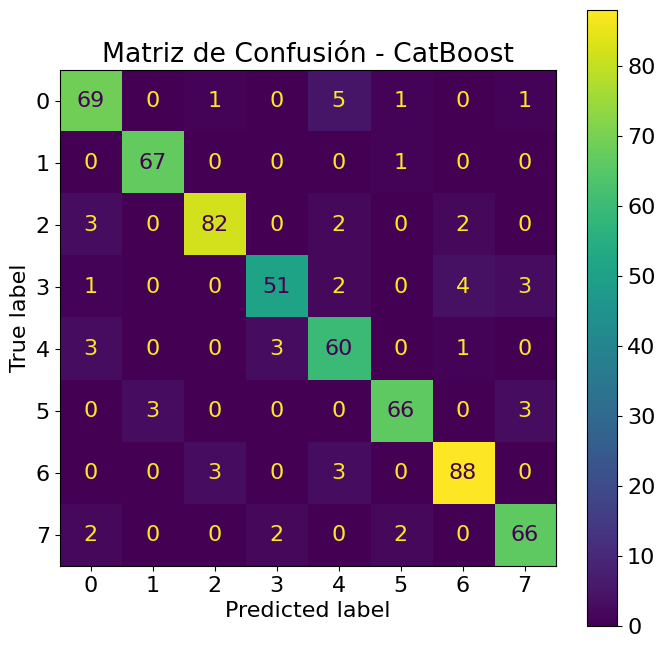

In [195]:
from catboost import CatBoostClassifier, Pool
categorical_features_indices = np.where(X.dtypes == 'object')[0]
categorical_features_indices = np.where(raw_df.dtypes == 'object')[0]

X = raw_df.drop('class', axis=1)
y = raw_df['class']

X_train_cat, X_test_cat, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=0, stratify=y
)

train_pool = Pool(X_train_cat, y_train, cat_features=categorical_features_indices)
test_pool = Pool(X_test_cat, y_test, cat_features=categorical_features_indices)

catboost_model = CatBoostClassifier(
    iterations=1000,
    depth=6,
    learning_rate=0.1,
    loss_function='MultiClass',
    verbose=0
)

catboost_model.fit(train_pool)

y_pred = catboost_model.predict(test_pool)

print("Classification Report for CatBoost:")
print(classification_report(y_test, y_pred))

plt.figure(figsize=(8, 8))
ConfusionMatrixDisplay.from_estimator(catboost_model, X_test_cat, y_test, ax=plt.subplot())
plt.title('Matriz de Confusión - CatBoost')
plt.show()

In [196]:
results_df.loc['CatBoost', 'train XV acc'] = np.nan
results_df.loc['CatBoost', 'test acc'] = accuracy_score(y_test, y_pred)
results_df.loc['CatBoost', 'precision score (M)'] = precision_score(y_test, y_pred, average='macro')
results_df.loc['CatBoost', 'recall score (M)'] = recall_score(y_test, y_pred, average='macro')
results_df.loc['CatBoost', 'f1 score (M)'] = f1_score(y_test, y_pred, average='macro')

show_html(results_df.sort_values(by='test acc', ascending=False).to_html())

,train XV acc,test acc,precision score (M),recall score (M),f1 score (M)
SVM RBF,0.946,0.937,0.937,0.934,0.936
Logistic,0.930,0.935,0.937,0.933,0.934
XGBoost,0.943,0.933,0.933,0.934,0.933
SVM Poly,0.942,0.928,0.928,0.926,0.926
CatBoost,NaN,0.915,0.914,0.913,0.913
Random Forest,0.812,0.847,0.847,0.838,0.841
Extra Trees,0.644,0.693,0.689,0.683,0.682


Vemos como efectivamente estos dos algoritmos de arboles, mejoran el rendimiento obtenido con el Random Forest y el Extrem Randomized Trees, incluso el XGBoost supera al SVM con kernel polinómico. Sin embargo vemos en las matrices de confusión y en el classification report, que los dos algoritmos son buenos donde los otros modelos ya eran buenos, por lo tanto probablemente no nos sean de gran utilidad al hacer un ensamble con ellos.

In [197]:
# XGBoost
r2_train_xgb = xgb_gs.score(X_train, y_train)
r2_test_xgb = xgb_gs.score(X_test, y_test)

print(f"R² del conjunto de entrenamiento (XGBoost): {r2_train_xgb:.4f}")
print(f"R² del conjunto de test (XGBoost): {r2_test_xgb:.4f}")

# CatBoost
r2_train_catboost = catboost_model.score(X_train_cat, y_train)
r2_test_catboost = catboost_model.score(X_test_cat, y_test)

print(f"R² del conjunto de entrenamiento (CatBoost): {r2_train_catboost:.4f}")
print(f"R² del conjunto de test (CatBoost): {r2_test_catboost:.4f}")

R² del conjunto de entrenamiento (XGBoost): 1.0000
R² del conjunto de test (XGBoost): 0.9333
R² del conjunto de entrenamiento (CatBoost): 0.9807
R² del conjunto de test (CatBoost): 0.9150


Finalmente como vemos, y como ya es sabido, los modelos de arboles sobreespecializan mucho, pese a que el XGBoost y el CatBoost obtengan mejores resultados, vemos como hay un sobreajuste muy pronunciado.

## Apartado E

Como hemos visto en teoría, cuando tenemos varios modelos podemos combinarlos usando diferentes estrategias. Entrena un StackedClassifer y un VotingClassifier usando la combinación de los tres mejores modelos que has encontrado en los apartados anteriores usando sus mejores hiperparámetros ¿Es mejor alguno de estos modelos combinados?

Procedemos a continuación a enrenar un StackingClassifier y un VotingClassifier con el mejor modelo con Regresión Logística, con el modelo SVM con kernel RBF y con el mejor modelo de árbol (que nos pedía el enunciado), el Random Forest con la parametrización vista previamente.

Para el Voting, emepzaremos con un voto más democrático cogiendo las probablidades de cada clase y no solo la que tiene una probabilidad mas alta, posteriormente probaremos cogiendo la mas alta a ver si mejora.

In [210]:
from sklearn.ensemble import StackingClassifier, VotingClassifier
from sklearn.linear_model import LogisticRegression

best_models = [
    ('svm_rbf', SVC(kernel='rbf', C=1, gamma='auto', probability=True)),
    ('logistic', LogisticRegression(C=0.1, penalty='l2', solver='lbfgs', max_iter=10000)),
    ('random_forest', RandomForestClassifier(bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200))
]

meta_model = LogisticRegression(max_iter=10000)
stacked_clf = StackingClassifier(estimators=best_models, final_estimator=meta_model, cv=5)
stacked_clf.fit(X_train, y_train)

y_pred_stacked = stacked_clf.predict(X_test)
print("Classification Report for Stacked Classifier:")
print(classification_report(y_test, y_pred_stacked))

voting_clf = VotingClassifier(estimators=best_models, voting='soft')
voting_clf.fit(X_train, y_train)

y_pred_voting = voting_clf.predict(X_test)
print("Classification Report for Voting Classifier:")
print(classification_report(y_test, y_pred_voting))

Classification Report for Stacked Classifier:
              precision    recall  f1-score   support

           0       0.95      0.95      0.95        77
           1       0.99      1.00      0.99        68
           2       0.96      0.96      0.96        89
           3       0.95      0.87      0.91        61
           4       0.86      0.93      0.89        67
           5       0.99      0.96      0.97        72
           6       0.91      0.91      0.91        94
           7       0.95      0.96      0.95        72

    accuracy                           0.94       600
   macro avg       0.94      0.94      0.94       600
weighted avg       0.94      0.94      0.94       600

Classification Report for Voting Classifier:
              precision    recall  f1-score   support

           0       0.93      0.96      0.94        77
           1       0.99      0.99      0.99        68
           2       0.97      0.96      0.96        89
           3       0.95      0.87      0.

In [199]:
voting_clf = VotingClassifier(estimators=best_models, voting='hard')
voting_clf.fit(X_train, y_train)

y_pred_voting = voting_clf.predict(X_test)
print("Classification Report for Voting Classifier:")
print(classification_report(y_test, y_pred_voting))

Classification Report for Voting Classifier:
              precision    recall  f1-score   support

           0       0.91      0.94      0.92        77
           1       1.00      0.99      0.99        68
           2       0.98      0.96      0.97        89
           3       0.98      0.87      0.92        61
           4       0.87      0.91      0.89        67
           5       0.94      0.92      0.93        72
           6       0.91      0.96      0.93        94
           7       0.91      0.93      0.92        72

    accuracy                           0.94       600
   macro avg       0.94      0.93      0.93       600
weighted avg       0.94      0.94      0.94       600



Simplemente mostrando el classification report de ambos Voting ya vemos como era de esperar que el de tipo soft funciona ligeramente mejor así que seguiremos con este tipo de aquí en adelante.

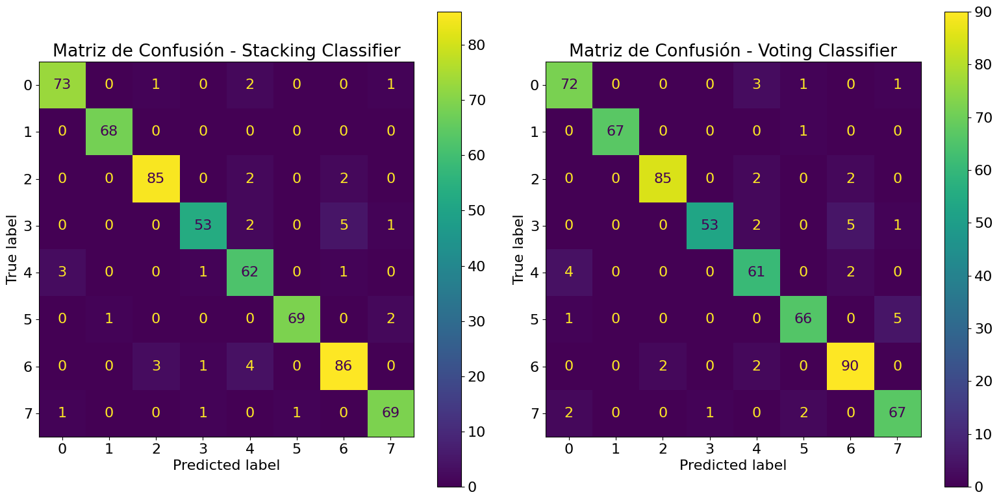

In [200]:
plt.figure(figsize=(16, 8))
ConfusionMatrixDisplay.from_estimator(stacked_clf, X_test, y_test, ax=plt.subplot(1, 2, 1))
plt.title('Matriz de Confusión - Stacking Classifier')

ConfusionMatrixDisplay.from_estimator(voting_clf, X_test, y_test, ax=plt.subplot(1, 2, 2))
plt.title('Matriz de Confusión - Voting Classifier')

plt.tight_layout()
plt.show()

In [201]:
results_df = save_results(stacked_clf, X_test, y_test, 'Stacking Classifier', results_df)
results_df = save_results(voting_clf, X_test, y_test, 'Voting Classifier', results_df)

show_html(results_df.sort_values(by='test acc', ascending=False).to_html())

,train XV acc,test acc,precision score (M),recall score (M),f1 score (M)
Stacking Classifier,NaN,0.942,0.943,0.941,0.942
SVM RBF,0.946,0.937,0.937,0.934,0.936
Logistic,0.930,0.935,0.937,0.933,0.934
Voting Classifier,NaN,0.935,0.937,0.932,0.934
XGBoost,0.943,0.933,0.933,0.934,0.933
SVM Poly,0.942,0.928,0.928,0.926,0.926
CatBoost,NaN,0.915,0.914,0.913,0.913
Random Forest,0.812,0.847,0.847,0.838,0.841
Extra Trees,0.644,0.693,0.689,0.683,0.682


Como vemos en los resultados, los modelos ensamble tanto de Stacking como de Voting, tienen unos resultados muy parecidos a los que hemos obtenido en los demas modelos, las clases que mejor predecimos siguen diendo la 1 la 2 y la 5 y el recall y la preicision individual es muy semejante al SVM con RBF.

Sin embargo vemos que obtenemos una precision y una f1 un 1% mejor que con el SVM con RBF  gracias a la ayuda de los demas modelos.

Probaremos ahora tammbien con un Stacking usando un DT para ver si mejora y así ver tambien que decisiones toma el modelo de forma visual para poder interpretarlos.

In [202]:
from sklearn.tree import DecisionTreeClassifier

best_models = [
    ('svm_rbf', SVC(kernel='rbf', C=1, gamma='auto', probability=True)),
    ('logistic', LogisticRegression(C=0.1, penalty='l2', solver='lbfgs', max_iter=10000)),
    ('random_forest', RandomForestClassifier(bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200))
]

meta_model = DecisionTreeClassifier(random_state=42)
stacked_clf_2 = StackingClassifier(estimators=best_models, final_estimator=meta_model, cv=5)
stacked_clf_2.fit(X_train, y_train)

y_pred_stacked = stacked_clf_2.predict(X_test)
print("Classification Report for Stacked Classifier:")
print(classification_report(y_test, y_pred_stacked))

Classification Report for Stacked Classifier:
              precision    recall  f1-score   support

           0       0.91      0.91      0.91        77
           1       0.99      1.00      0.99        68
           2       0.95      0.92      0.94        89
           3       0.87      0.85      0.86        61
           4       0.85      0.93      0.89        67
           5       0.96      0.93      0.94        72
           6       0.94      0.90      0.92        94
           7       0.91      0.94      0.93        72

    accuracy                           0.92       600
   macro avg       0.92      0.92      0.92       600
weighted avg       0.92      0.92      0.92       600



In [203]:
meta_model = stacked_clf_2.final_estimator_
meta_model.fit(X_train, y_train)

v_model = dtreeviz.model(meta_model, 
                   X_train=X_train,
                   y_train=y_train,
                   target_name='class',
                   feature_names=X_train.columns,
                   class_names=[str(cls) for cls in y_train.unique()]
                   )
v_model.view(scale=1.5, title="Decision Tree - Stacked Classifier Meta Model", orientation='LR')

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

Vemos como los primeros niveles siempre discriminan por altura o edad y despues ya va filtrando con otras variables.

Vemos como hay una gran sobreespecialización dado que en las hojas solo tenemos ejemplos de una clase, el arbol no para hasta que una hoja no tenga todos los ejemplos de una misma clase.

Los resultados no son mejores que los obtenidos con la regresion logística así que procederemos con la regresión logística.

#### Explicación de los resultados obentidos

Cuando usamos una combinación de modelos individuales en un ensamble y no obtenemos mucha mejora respecto algun modelo individual, suele ser porque ya hay modelos muy especializados de forma generalizada y si encima todos tienen mas o menos los mismos resultados todo ayuda a que el ensamble se parezca al mejor modelo de todos los usados.

Si por ejemplo cada modelo se hubiese especializado en 2 o 3 clases distintas, la combinación seguramente hubiese resultado mucho mejor.

Tambien podriamos probar dando mas peso a algunos modelos en el caso del Voting.

Procederemos a continuación a ver la importancia de las distintas características

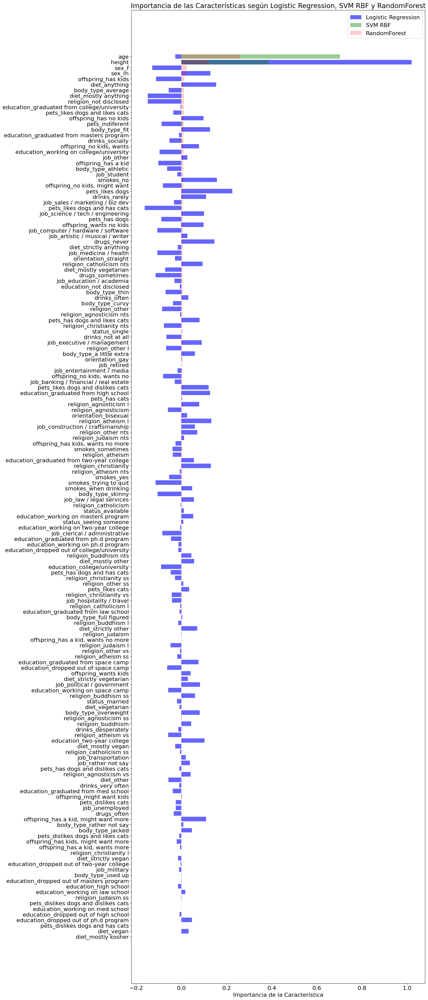

In [204]:
from sklearn.inspection import permutation_importance

importances_lr = lr_gs.best_estimator_.coef_[0]
indices_lr = np.argsort(importances_lr)[::-1]

result_svm_rbf = permutation_importance(svm_rbf_gs.best_estimator_, X_test, y_test, n_repeats=10, random_state=42)
importances_svm_rbf = result_svm_rbf.importances_mean
indices_svm_rbf = np.argsort(importances_svm_rbf)[::-1]

importances_rf = rf_gs.best_estimator_.feature_importances_
indices_rf = np.argsort(importances_rf)[::-1]

feature_importances_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Logistic Regression Importance': importances_lr,
    'SVM RBF Importance': importances_svm_rbf,
    'RandomForest Importance': importances_rf
})

feature_importances_df = feature_importances_df.sort_values(by='RandomForest Importance', ascending=False)

plt.figure(figsize=(15, 50))
plt.barh(feature_importances_df['Feature'], feature_importances_df['Logistic Regression Importance'], color='b', alpha=0.6, label='Logistic Regression')
plt.barh(feature_importances_df['Feature'], feature_importances_df['SVM RBF Importance'], color='g', alpha=0.4, label='SVM RBF')
plt.barh(feature_importances_df['Feature'], feature_importances_df['RandomForest Importance'], color='r', alpha=0.2, label='RandomForest')
plt.xlabel('Importancia de la Característica')
plt.title('Importancia de las Características según Logistic Regression, SVM RBF y RandomForest')
plt.legend()
plt.gca().invert_yaxis()
plt.show()

Como vemos y era de esperar en los tres primeros modelos las variables con mas importancia son la altura, la edad y el genero, aunque vemos que la regresion logística se comporta de forma bastante distinta a los otros dos.

Si analizamos solo los tres modelos de arboles (con variables númericas)

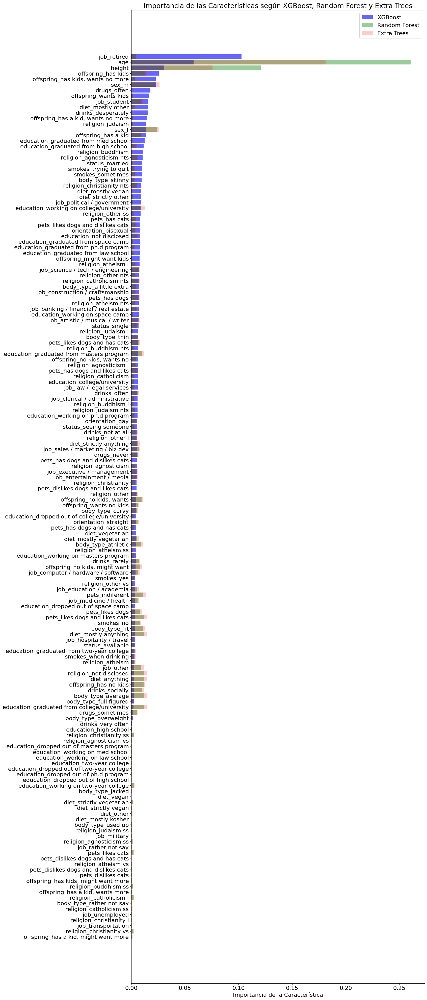

In [205]:
importances_xgb = xgb_gs.best_estimator_.feature_importances_
indices_xgb = np.argsort(importances_xgb)[::-1]

importances_rf = rf_gs.best_estimator_.feature_importances_
indices_rf = np.argsort(importances_rf)[::-1]

importances_et = et_gs.best_estimator_.feature_importances_
indices_et = np.argsort(importances_et)[::-1]

feature_importances_df = pd.DataFrame({
    'Feature': X_train.columns,
    'XGBoost Importance': importances_xgb,
    'Random Forest Importance': importances_rf,
    'Extra Trees Importance': importances_et
})

feature_importances_df = feature_importances_df.sort_values(by='XGBoost Importance', ascending=False)

plt.figure(figsize=(15, 50))
plt.barh(feature_importances_df['Feature'], feature_importances_df['XGBoost Importance'], color='b', alpha=0.6, label='XGBoost')
plt.barh(feature_importances_df['Feature'], feature_importances_df['Random Forest Importance'], color='g', alpha=0.4, label='Random Forest')
plt.barh(feature_importances_df['Feature'], feature_importances_df['Extra Trees Importance'], color='r', alpha=0.2, label='Extra Trees')
plt.xlabel('Importancia de la Característica')
plt.title('Importancia de las Características según XGBoost, Random Forest y Extra Trees')
plt.legend()
plt.gca().invert_yaxis()
plt.show()

Vemos como tambien le dan mas importancia a las mismas varibales comentadas previamente


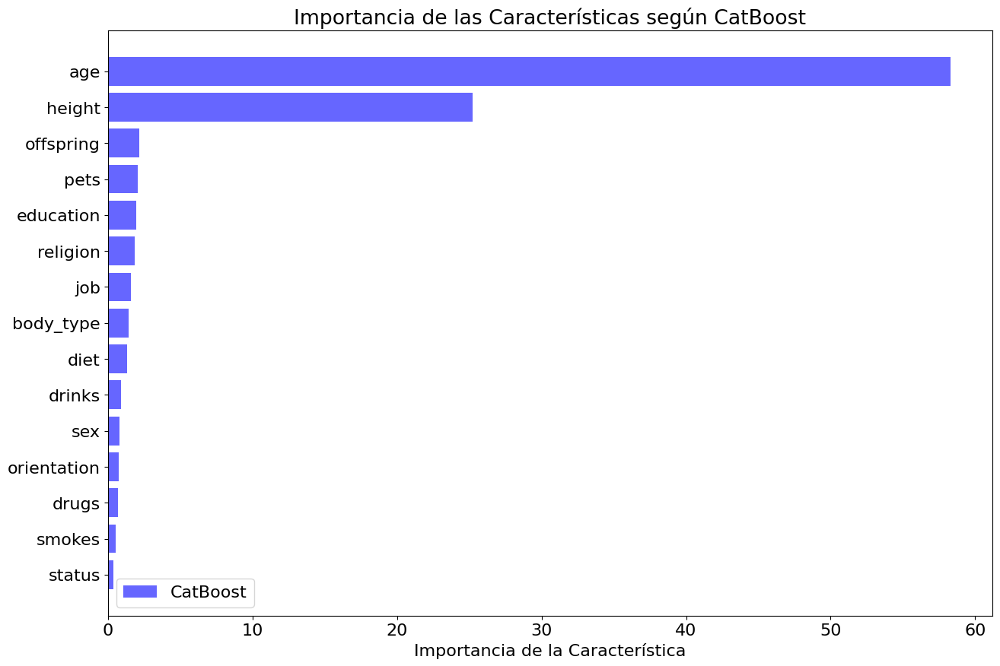

In [206]:
importances_catboost = catboost_model.get_feature_importance(train_pool)
indices_catboost = np.argsort(importances_catboost)[::-1]

feature_importances_df = pd.DataFrame({
    'Feature': X_train_cat.columns,
    'CatBoost Importance': importances_catboost
})

feature_importances_df = feature_importances_df.sort_values(by='CatBoost Importance', ascending=False)

plt.figure(figsize=(15, 10))
plt.barh(feature_importances_df['Feature'], feature_importances_df['CatBoost Importance'], color='b', alpha=0.6, label='CatBoost')
plt.xlabel('Importancia de la Característica')
plt.title('Importancia de las Características según CatBoost')
plt.legend()
plt.gca().invert_yaxis()
plt.show()


Vemos como el CatBoost tambien le da mucha importancia a la edad y a la altura pero no tanta al sexo.

Procederemos ahora a mostrar la curva ROC, para ver los dos modelos que peores resultados nos han dado.

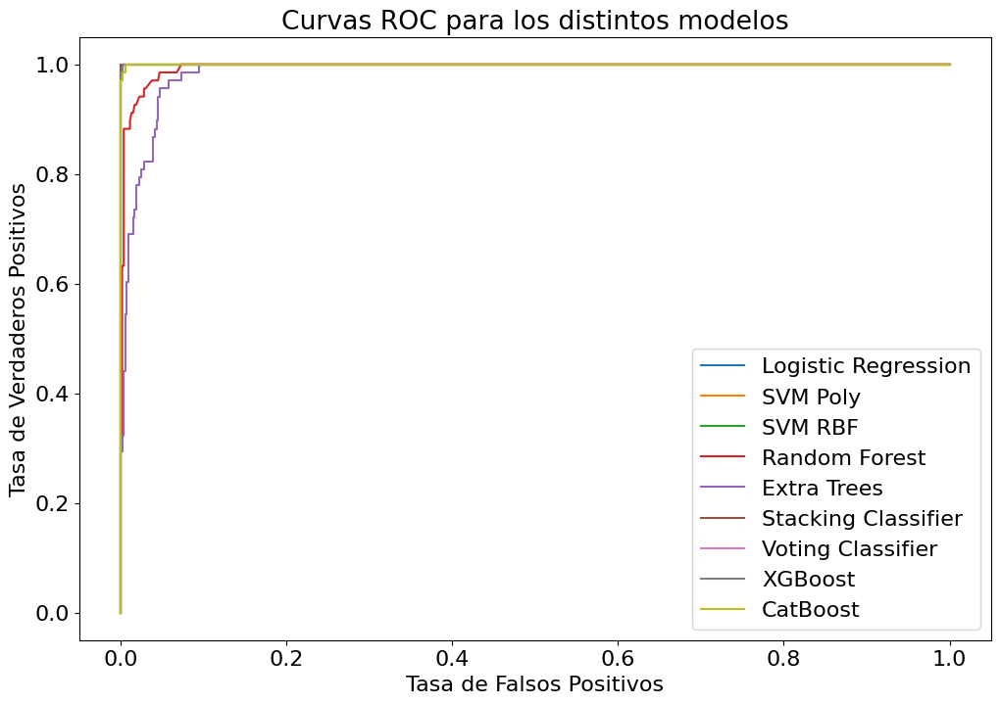

In [212]:
from sklearn.metrics import roc_curve, RocCurveDisplay

# Obtener las probabilidades de predicción para cada modelo
y_prob_logistic = lr_gs.predict_proba(X_test)
y_prob_svm_poly = svm_poly_gs.predict_proba(X_test)
y_prob_svm_rbf = svm_rbf_gs.predict_proba(X_test)
y_prob_rf = rf_gs.predict_proba(X_test)
y_prob_et = et_gs.predict_proba(X_test)
y_prob_stacked = stacked_clf.predict_proba(X_test)
y_prob_voting = voting_clf.predict_proba(X_test)
y_prob_xgb = xgb_gs.predict_proba(X_test)
y_prob_catboost = catboost_model.predict_proba(test_pool)


plt.figure(figsize=(12, 8))

for y_prob, label in zip([y_prob_logistic, y_prob_svm_poly, y_prob_svm_rbf, y_prob_rf, y_prob_et, y_prob_stacked, y_prob_voting, y_prob_xgb, y_prob_catboost],
                         ['Logistic Regression', 'SVM Poly', 'SVM RBF', 'Random Forest', 'Extra Trees', 'Stacking Classifier', 'Voting Classifier', 'XGBoost', 'CatBoost']):
    fpr, tpr, _ = roc_curve(y_test, y_prob[:, 1], pos_label=1)
    plt.plot(fpr, tpr, label=label)

plt.title('Curvas ROC para los distintos modelos')
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.legend(loc='best')
plt.show()

Vemos como todos los modelos casi tienen una AUC de 1 excepto el Random Forest y el Extra Trees en los cuales sacrificando un 5% de falsos positivos podriamos alcanzar un 80% de TP, aunque no nos encontramos en un problema donde nos interese claramente tener mas precision o mas recall como podria ser en la detección de una enfermedad.

In [213]:
# Stacked Classifier
r2_train_stacked = stacked_clf.score(X_train, y_train)
r2_test_stacked = stacked_clf.score(X_test, y_test)

print(f"R² del conjunto de entrenamiento (Stacked Classifier): {r2_train_stacked:.4f}")
print(f"R² del conjunto de test (Stacked Classifier): {r2_test_stacked:.4f}")

# Voting Classifier
r2_train_voting = voting_clf.score(X_train, y_train)
r2_test_voting = voting_clf.score(X_test, y_test)

print(f"R² del conjunto de entrenamiento (Voting Classifier): {r2_train_voting:.4f}")
print(f"R² del conjunto de test (Voting Classifier): {r2_test_voting:.4f}")

R² del conjunto de entrenamiento (Stacked Classifier): 0.9871
R² del conjunto de test (Stacked Classifier): 0.9417
R² del conjunto de entrenamiento (Voting Classifier): 0.9964
R² del conjunto de test (Voting Classifier): 0.9400


Finalmente como vemos, tanto el stacked como el voting sobreespecializan algo mas que el SVM y que la regresion logística pese a obtener mejors resultados. Y entre el stacking y el voting me quedaría con el stacking dado que sobreespecializa menos que el voting y obtiene mejores resultados.

#### Extension del Stacking y Voting

Finalmente probaremos a ver si añadiendo el XGBoost y el CatBoost mejora algun modelo de ensamble

Classification Report for Extended Stacked Classifier:
              precision    recall  f1-score   support

           0       0.95      0.94      0.94        77
           1       0.99      1.00      0.99        68
           2       0.97      0.94      0.95        89
           3       0.95      0.89      0.92        61
           4       0.84      0.93      0.88        67
           5       0.96      0.96      0.96        72
           6       0.94      0.93      0.93        94
           7       0.94      0.94      0.94        72

    accuracy                           0.94       600
   macro avg       0.94      0.94      0.94       600
weighted avg       0.94      0.94      0.94       600

Classification Report for Extended Voting Classifier:
              precision    recall  f1-score   support

           0       0.94      0.95      0.94        77
           1       0.99      1.00      0.99        68
           2       0.97      0.94      0.95        89
           3       0.96

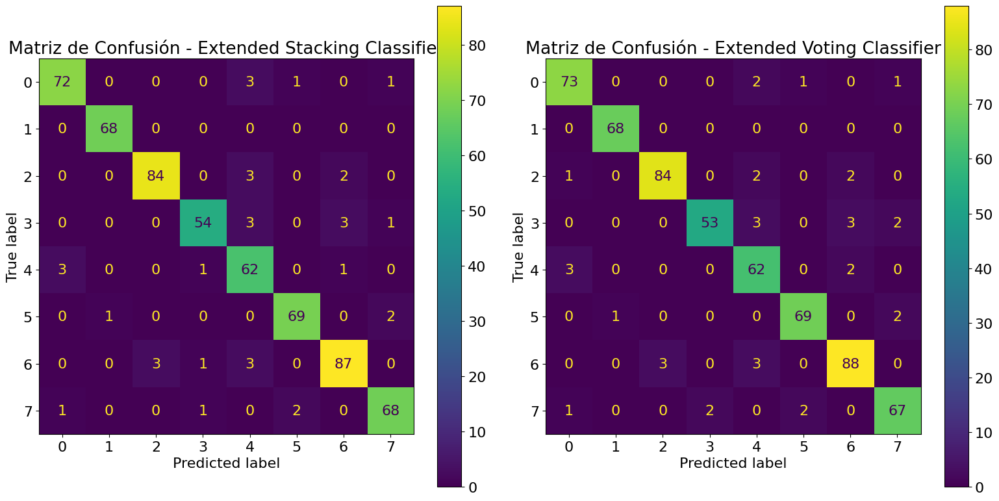

,train XV acc,test acc,precision score (M),recall score (M),f1 score (M)
Stacking Classifier,NaN,0.942,0.943,0.941,0.942
Extended Stacking Classifier,NaN,0.940,0.940,0.940,0.940
Extended Voting Classifier,NaN,0.940,0.941,0.939,0.939
SVM RBF,0.946,0.937,0.937,0.934,0.936
Logistic,0.930,0.935,0.937,0.933,0.934
Voting Classifier,NaN,0.935,0.937,0.932,0.934
XGBoost,0.943,0.933,0.933,0.934,0.933
SVM Poly,0.942,0.928,0.928,0.926,0.926
CatBoost,NaN,0.915,0.914,0.913,0.913
Random Forest,0.812,0.847,0.847,0.838,0.841


In [214]:
from sklearn.ensemble import StackingClassifier, VotingClassifier
from sklearn.linear_model import LogisticRegression

# Añadir los modelos de XGBoost y CatBoost a la lista de mejores modelos
best_models_extended = [
    ('svm_rbf', SVC(kernel='rbf', C=1, gamma='auto', probability=True)),
    ('logistic', LogisticRegression(C=0.1, penalty='l2', solver='lbfgs', max_iter=10000)),
    ('random_forest', RandomForestClassifier(bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200)),
    ('xgboost', xgb_gs.best_estimator_),
    ('catboost', catboost_model)
]

meta_model = LogisticRegression(max_iter=10000)
stacked_clf_extended = StackingClassifier(estimators=best_models_extended, final_estimator=meta_model, cv=5)
stacked_clf_extended.fit(X_train, y_train)

y_pred_stacked_extended = stacked_clf_extended.predict(X_test)
print("Classification Report for Extended Stacked Classifier:")
print(classification_report(y_test, y_pred_stacked_extended))

voting_clf_extended = VotingClassifier(estimators=best_models_extended, voting='soft')
voting_clf_extended.fit(X_train, y_train)

y_pred_voting_extended = voting_clf_extended.predict(X_test)
print("Classification Report for Extended Voting Classifier:")
print(classification_report(y_test, y_pred_voting_extended))

plt.figure(figsize=(16, 8))
ConfusionMatrixDisplay.from_estimator(stacked_clf_extended, X_test, y_test, ax=plt.subplot(1, 2, 1))
plt.title('Matriz de Confusión - Extended Stacking Classifier')

ConfusionMatrixDisplay.from_estimator(voting_clf_extended, X_test, y_test, ax=plt.subplot(1, 2, 2))
plt.title('Matriz de Confusión - Extended Voting Classifier')

plt.tight_layout()
plt.show()

results_df = save_results(stacked_clf_extended, X_test, y_test, 'Extended Stacking Classifier', results_df)
results_df = save_results(voting_clf_extended, X_test, y_test, 'Extended Voting Classifier', results_df)

show_html(results_df.sort_values(by='test acc', ascending=False).to_html())

Vemos como debido a que tanto el XGBoost como el CatBoost se comportaban de forma muy similar en todas las clases, no obtenemos una mejora en los modelos de ensamble, son incluso un 0.2% peores en cuanto a la métrica f1 de la macro.

In [215]:
print(f"Total Running time {timedelta(seconds=(time() - init_time))}")

Total Running time 0:17:27.217047
